# LCBR vs CL-CBS -- Experimental Analysis

This notebook is organized around **four layers of evidence**, each
answering a different question about LCBR. Skipping a layer, or pooling
results across `map_size`/`scenario` that should be kept separate,
silently weakens every claim built on top of it -- so each layer is kept
explicit and stratified throughout.

| Layer | Question | Why it matters |
|---|---|---|
| **0. Validity** | Can I trust this data at all? | If LCBR fails where CL-CBS succeeds, nothing else matters. |
| **1. Does it work?** | Does localizing the query reduce search effort, at what quality cost? | This is the headline claim -- `E_tot` (not raw runtime) is the machine-independent evidence for it. |
| **2. Why does it work?** | Is the mechanism doing what it claims (genuinely *local* repairs), or is it accidentally reproducing full-horizon behavior? | A paper claiming "local repair" needs `window_fraction` evidence that repairs are actually local. |
| **3. When does it help most?** | Is there a universal `delta_w` sweet spot? Does the gain grow with conflict difficulty? | The most interesting, genuinely novel findings tend to live here. |

Raw data sources (see `include/experiment_logger.hpp` for the exact
field-by-field definitions):
- **`instance_metrics.csv`** -- one row per (instance, method[, delta_w]) run.
- **`low_level_queries.csv`** -- one row per individual SHA* call.


In [27]:
import os
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 160)

sys.path.insert(0, ".")
import _load

REPO_ROOT = os.path.abspath("..")

# --- Point these at your run_id folders. discover_runs() auto-finds every
# completed run for an experiment; merge_runs(dedupe=True) concatenates
# them and keeps the most-recently-listed run_dir if the same
# (instance_id, method, delta_w) appears more than once (e.g. you re-ran
# the same config twice). ---
RUN_DIRS = _load.discover_runs("main_comparison", REPO_ROOT)
print(f"Discovered {len(RUN_DIRS)} main_comparison run(s):")
for rd in RUN_DIRS:
    print(" ", rd)

# Optional: point this at a runs/delta_w_ablation/<run_id>/ to enable
# Layer 3's repair-window ablation section. Leave as None to skip it.
DELTA_W_ABLATION_RUN_DIRS = _load.discover_runs("delta_w_ablation", REPO_ROOT)
print(f"\nDiscovered {len(DELTA_W_ABLATION_RUN_DIRS)} delta_w_ablation run(s):")
for rd in DELTA_W_ABLATION_RUN_DIRS:
    print(" ", rd)

# Which delta_w to use for every table/figure below that needs exactly
# ONE LCBR configuration (Layers 0-2). Layer 3's ablation uses every
# delta_w value instead.
MAIN_DW = 10


Discovered 9 main_comparison run(s):
  /home/batbaina/Downloads/UGV-COORDINATION/LCBR/runs/main_comparison/20260811T212353
  /home/batbaina/Downloads/UGV-COORDINATION/LCBR/runs/main_comparison/20260811T214001
  /home/batbaina/Downloads/UGV-COORDINATION/LCBR/runs/main_comparison/20260811T215432
  /home/batbaina/Downloads/UGV-COORDINATION/LCBR/runs/main_comparison/20260811T225748
  /home/batbaina/Downloads/UGV-COORDINATION/LCBR/runs/main_comparison/20260811T235747
  /home/batbaina/Downloads/UGV-COORDINATION/LCBR/runs/main_comparison/20260812T003747
  /home/batbaina/Downloads/UGV-COORDINATION/LCBR/runs/main_comparison/20260812T121025
  /home/batbaina/Downloads/UGV-COORDINATION/LCBR/runs/main_comparison/20260812T170559
  /home/batbaina/Downloads/UGV-COORDINATION/LCBR/runs/main_comparison/20260812T180148

Discovered 0 delta_w_ablation run(s):


## Load the raw data

`map_size` and `scenario` are derived from `instance_id`'s filename
pattern (Wen et al.'s own naming convention: `map_{size}_obst{N}_...`) --
they do NOT exist as their own columns in the raw CSV, so every
downstream table/figure that groups by them depends on this cell having
run first.


In [28]:
instances, queries = _load.merge_runs(RUN_DIRS)

instances["map_size"] = instances.instance_id.str.extract(r"map_(\d+by\d+)_")
obst = instances.instance_id.str.extract(r"obst(\d+)_")[0]
instances["scenario"] = np.where(obst.isna(), "unknown",
                                 np.where(obst.astype("Int64") == 0, "empty", "obstacle"))

# N_LL ("total number of actual SHA* calls") needs a DIFFERENT formula per
# method -- CL-CBS only ever issues full-horizon calls; LCBR issues local
# calls (success+fail) PLUS full-horizon fallback calls. Getting this
# wrong (e.g. counting only local calls for LCBR) silently underestimates
# LCBR's true low-level call count.
instances["N_LL"] = np.where(
    instances.method == "CL-CBS",
    instances.N_full_baseline,
    instances.N_success + instances.N_fail + instances.N_full_fallback,
)
instances["E_bar"] = instances.E_tot / instances.N_LL.replace(0, np.nan)

print(f"instances: {instances.shape}")
print(f"queries:   {queries.shape if queries is not None else None}")
instances.head()


[merge_runs] dropped 915 duplicate (instance_id, method, delta_w_steps) row(s) -- kept the most recently listed run_dir for each; pass dedupe=False to keep every row instead.
instances: (1119, 32)
queries:   (157805, 27)


,instance_id,method,delta_w_steps,delta_T_steps,num_agents,success,timeout,total_runtime_s,nominal_gen_runtime_s,lap_runtime_s,conflict_resolution_runtime_s,bct_nodes_expanded,N_success,N_fail,N_inapplicable,N_full_baseline,N_full_fallback,E_tot,E_local_success,E_local_fail,E_full,SoC_nominal,SoC_final,L_max_final,mission_completion_time,N_switch,D_reverse,_source_run_dir,map_size,scenario,N_LL,E_bar
0,map_300by300_obst0_agents10_ex0,CL-CBS,10,2,10,1,0,13.94160,13.85250,0.000003,0.000106,1,0,0,0,0,0,0,0,0,0,752.220,752.220,107.044,52,3,13.8446,/home/batbaina/Downloads/UGV-COORDINATION/LCBR...,300by300,empty,0,NaN
1,map_300by300_obst0_agents10_ex0,LCBR,10,2,10,1,0,13.84730,13.75870,0.000003,0.000106,1,0,0,0,0,0,0,0,0,0,752.220,752.220,107.044,52,3,13.8446,/home/batbaina/Downloads/UGV-COORDINATION/LCBR...,300by300,empty,0,NaN
2,map_300by300_obst0_agents10_ex1,CL-CBS,10,2,10,1,0,13.63480,13.32260,0.000005,0.229228,2,0,0,0,2,0,7697,0,0,7697,897.472,897.501,129.192,62,5,29.9721,/home/batbaina/Downloads/UGV-COORDINATION/LCBR...,300by300,empty,2,3848.5
3,map_300by300_obst0_agents10_ex1,LCBR,10,2,10,1,0,13.50310,13.30030,0.000005,0.119015,2,1,0,1,0,1,4301,153,0,4148,897.472,897.222,129.192,63,5,30.4753,/home/batbaina/Downloads/UGV-COORDINATION/LCBR...,300by300,empty,2,2150.5
4,map_300by300_obst0_agents10_ex10,CL-CBS,10,2,10,1,0,8.62177,8.52218,0.000005,0.013223,2,0,0,0,2,0,359,0,0,359,743.549,739.391,138.099,67,5,24.5177,/home/batbaina/Downloads/UGV-COORDINATION/LCBR...,300by300,empty,2,179.5


In [48]:
print("instance_metrics.csv columns:", list(instances.columns))
print()
print("low_level_queries.csv columns:", list(queries.columns) if queries is not None else None)


instance_metrics.csv columns: ['instance_id', 'method', 'delta_w_steps', 'delta_T_steps', 'num_agents', 'success', 'timeout', 'total_runtime_s', 'nominal_gen_runtime_s', 'lap_runtime_s', 'conflict_resolution_runtime_s', 'bct_nodes_expanded', 'N_success', 'N_fail', 'N_inapplicable', 'N_full_baseline', 'N_full_fallback', 'E_tot', 'E_local_success', 'E_local_fail', 'E_full', 'SoC_nominal', 'SoC_final', 'L_max_final', 'mission_completion_time', 'N_switch', 'D_reverse', '_source_run_dir', 'map_size', 'scenario', 'N_LL', 'E_bar']

low_level_queries.csv columns: ['instance_id', 'method', 'bct_node_id', 'robot_id', 'query_type', 'local_outcome', 'failure_reason', 't_conflict', 't_minus', 't_plus', 'T_w', 'T_i_current', 'window_fraction', 'T_star', 'delta_T_repair', 'sha_expansions', 'sha_runtime_s', 'fallback_triggered', 'g_before', 'g_after', 'path_length_before', 'path_length_after', 'reconnection_residual', 'junction_correction_skipped', 'clipped_left', 'clipped_right', '_source_run_dir']


## Layer 0 -- Validity: can this data be trusted?

Before computing anything else: check success/timeout rates, and where
CL-CBS and LCBR disagree on whether an instance is solvable. If LCBR
fails on instances CL-CBS solves, everything built on top of this data is
suspect regardless of how fast LCBR looks where it *does* succeed.
`timeout` distinguishes a wall-clock timeout from a genuine
infeasibility/search-exhaustion failure (Eq. 6) -- conflating the two
makes an ambiguous failure look like an unexplained bug.


In [53]:
print("Rows by (map_size, scenario, method, delta_w_steps):")
print(instances.groupby(["map_size", "scenario", "method", "delta_w_steps"]).size())
print()

print("Success / timeout breakdown by method:")
print(instances.groupby("method")[["success", "timeout"]].mean().round(3))
print()

failed = instances[instances.success == 0]
if len(failed):
    print(f"{len(failed)} failed run(s) -- timeout=1 means a wall-clock timeout, "
         f"timeout=0 means genuine infeasibility/search exhaustion:")
    display(failed[["instance_id", "method", "map_size", "num_agents", "timeout"]])
else:
    print("No failed runs in this data.")


Rows by (map_size, scenario, method, delta_w_steps):
map_size  scenario  method  delta_w_steps
100by100  empty     CL-CBS  10               100
                    LCBR    10               100
          obstacle  CL-CBS  10               100
                    LCBR    10               100
300by300  empty     CL-CBS  10                60
                    LCBR    10                60
          obstacle  CL-CBS  10                60
                    LCBR    10                60
50by50    empty     CL-CBS  10               120
                    LCBR    10               120
          obstacle  CL-CBS  10               120
                    LCBR    10               119
dtype: int64

Success / timeout breakdown by method:
        success  timeout
method                  
CL-CBS    0.943    0.004
LCBR      0.946    0.000

62 failed run(s) -- timeout=1 means a wall-clock timeout, timeout=0 means genuine infeasibility/search exhaustion:


,instance_id,method,map_size,num_agents,timeout
156,map_300by300_obst100_agents20_ex25,CL-CBS,300by300,20,0
157,map_300by300_obst100_agents20_ex25,LCBR,300by300,20,0
200,map_300by300_obst100_agents30_ex0,CL-CBS,300by300,30,0
201,map_300by300_obst100_agents30_ex0,LCBR,300by300,30,0
432,map_100by100_obst50_agents10_ex28,CL-CBS,100by100,10,0
...,...,...,...,...,...
1110,map_50by50_obst25_agents20_ex31,LCBR,50by50,20,0
1113,map_50by50_obst25_agents20_ex33,CL-CBS,50by50,20,0
1114,map_50by50_obst25_agents20_ex33,LCBR,50by50,20,0
1117,map_50by50_obst25_agents20_ex35,CL-CBS,50by50,20,0


In [31]:
def resolution_matrix(df, delta_w=MAIN_DW):
    """2x2 cross-solver success matrix. Uses the FULL instance set (not
    just paired successes), since this table is precisely about who
    succeeds where."""
    clcbs = df[df.method == "CL-CBS"].set_index("instance_id").success
    lcbr = df[(df.method == "LCBR") & (df.delta_w_steps == delta_w)].set_index("instance_id").success
    common_idx = clcbs.index.intersection(lcbr.index)
    cc, ll = clcbs.loc[common_idx], lcbr.loc[common_idx]
    return pd.DataFrame(
        [[int(((cc==1)&(ll==1)).sum()), int(((cc==1)&(ll==0)).sum())],
         [int(((cc==0)&(ll==1)).sum()), int(((cc==0)&(ll==0)).sum())]],
        index=["CL-CBS solves", "CL-CBS fails"], columns=["LCBR solves", "LCBR fails"])

print("Cross-solver success matrix, per map_size (Table III):")
print("Watch the top-right cell ('CL-CBS solves, LCBR fails') -- it should be near 0.")
print()
for map_size in sorted(instances.map_size.dropna().unique()):
    df_ms = instances[instances.map_size == map_size]
    if not (df_ms.method == "LCBR").any() or not (df_ms.method == "CL-CBS").any():
        continue
    print(f"=== map_size={map_size} ===")
    print(resolution_matrix(df_ms, delta_w=MAIN_DW))
    print()


Cross-solver success matrix, per map_size (Table III):
Watch the top-right cell ('CL-CBS solves, LCBR fails') -- it should be near 0.

=== map_size=100by100 ===
               LCBR solves  LCBR fails
CL-CBS solves          193           0
CL-CBS fails             0           7

=== map_size=300by300 ===
               LCBR solves  LCBR fails
CL-CBS solves          118           0
CL-CBS fails             0           2

=== map_size=50by50 ===
               LCBR solves  LCBR fails
CL-CBS solves          216           0
CL-CBS fails             2          21



## Paired-subset builder

Used by every Layer-1/2 table and figure below. Returns `(c, l)`: CL-CBS
and LCBR-at-`delta_w` rows restricted to instances solved by **both**
methods (`I_both`), aligned so `a / b` on two returned columns is a
correct, index-aligned per-instance ratio (pandas aligns Series by index
*label*, not row position). The assertions guard against the one way this
silently breaks: if `instances` ever contains more than one row per
(instance_id, method, delta_w) -- e.g. after merging an ablation run
without filtering `delta_w` first -- `.loc[]` would return multiple rows
per instance and corrupt every ratio computed downstream without any
visible error.


In [55]:
def make_paired(df, delta_w=MAIN_DW):
    clcbs = df[df.method == "CL-CBS"]
    lcbr = df[(df.method == "LCBR") & (df.delta_w_steps == delta_w)]

    assert not clcbs.instance_id.duplicated().any(), \
        "duplicate CL-CBS rows for the same instance_id -- re-run merge_runs(dedupe=True)"
    assert not lcbr.instance_id.duplicated().any(), \
        f"duplicate LCBR rows at delta_w={delta_w} -- filter to one map_size/run first?"

    clcbs = clcbs.set_index("instance_id")
    lcbr = lcbr.set_index("instance_id")
    both_success = clcbs.index[clcbs.success == 1].intersection(lcbr.index[lcbr.success == 1])
    c = clcbs.loc[both_success].copy()
    l = lcbr.loc[both_success].copy()
    return c, l


c_all, l_all = make_paired(instances, delta_w=MAIN_DW)
print(f"n resolved by both (all map sizes, delta_w={MAIN_DW}): {len(c_all)} / "
     f"{(instances.method=='CL-CBS').sum()} CL-CBS instances total")
c_all.head()


n resolved by both (all map sizes, delta_w=10): 527 / 560 CL-CBS instances total


,method,delta_w_steps,delta_T_steps,num_agents,success,timeout,total_runtime_s,nominal_gen_runtime_s,lap_runtime_s,conflict_resolution_runtime_s,bct_nodes_expanded,N_success,N_fail,N_inapplicable,N_full_baseline,N_full_fallback,E_tot,E_local_success,E_local_fail,E_full,SoC_nominal,SoC_final,L_max_final,mission_completion_time,N_switch,D_reverse,_source_run_dir,map_size,scenario,N_LL,E_bar
instance_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
map_300by300_obst0_agents10_ex0,CL-CBS,10,2,10,1,0,13.94160,13.85250,0.000003,0.000106,1,0,0,0,0,0,0,0,0,0,752.220,752.220,107.044,52,3,13.84460,/home/batbaina/Downloads/UGV-COORDINATION/LCBR...,300by300,empty,0,NaN
map_300by300_obst0_agents10_ex1,CL-CBS,10,2,10,1,0,13.63480,13.32260,0.000005,0.229228,2,0,0,0,2,0,7697,0,0,7697,897.472,897.501,129.192,62,5,29.97210,/home/batbaina/Downloads/UGV-COORDINATION/LCBR...,300by300,empty,2,3848.5
map_300by300_obst0_agents10_ex10,CL-CBS,10,2,10,1,0,8.62177,8.52218,0.000005,0.013223,2,0,0,0,2,0,359,0,0,359,743.549,739.391,138.099,67,5,24.51770,/home/batbaina/Downloads/UGV-COORDINATION/LCBR...,300by300,empty,2,179.5
map_300by300_obst0_agents10_ex11,CL-CBS,10,2,10,1,0,5.07648,4.99737,0.000003,0.000139,1,0,0,0,0,0,0,0,0,0,731.805,731.805,118.356,58,5,7.08199,/home/batbaina/Downloads/UGV-COORDINATION/LCBR...,300by300,empty,0,NaN
map_300by300_obst0_agents10_ex12,CL-CBS,10,2,10,1,0,9.23575,9.15560,0.000006,0.000151,1,0,0,0,0,0,0,0,0,0,771.840,771.840,136.636,67,6,16.70620,/home/batbaina/Downloads/UGV-COORDINATION/LCBR...,300by300,empty,0,NaN


## Layer 1 -- Does it work? Table I: per-method summary

`success_pct` is computed over the FULL instance set (every attempt);
every other column is computed by calling `make_paired()` **per
map_size** and concatenating, so a 50x50 row is never averaged together
with a 300x300 row. This is the only table where success rate and
performance metrics legitimately come from different-sized populations
-- by design (Layer-0 sanity vs. Layer-1 performance are different
questions).


In [57]:
# ============================================================
# Table I -- Main comparison
# Success rate: all attempted instances
# Performance: instances solved by both methods (I_both)
# Stratified by map size and scenario
# ============================================================

success_summary = (
    instances
    .groupby(["method", "map_size", "scenario", "delta_w_steps"])
    .agg(
        n_attempted=("instance_id", "count"),
        success_pct=("success", lambda s: 100 * s.mean()),
    )
    .reset_index()
)

# Keep CL-CBS and the default LCBR configuration only
success_summary = success_summary[
    (success_summary["method"] == "CL-CBS") |
    (
        (success_summary["method"] == "LCBR") &
        (success_summary["delta_w_steps"] == MAIN_DW)
    )
]


perf_rows = []

for (map_size, scenario), df_cell in instances.groupby(
    ["map_size", "scenario"]
):

    # Both methods must be present
    if not (df_cell["method"] == "CL-CBS").any():
        continue
    if not (df_cell["method"] == "LCBR").any():
        continue

    # I_both: same instances successfully solved by both methods
    cc, ll = make_paired(df_cell, delta_w=MAIN_DW)

    for method, d in [("CL-CBS", cc), ("LCBR", ll)]:

        if d.empty:
            continue

        perf_rows.append({
            "method": method,
            "map_size": map_size,
            "scenario": scenario,
            "n_paired": len(d),

            # Stage-3 runtime
            "runtime_median_s":
                d["conflict_resolution_runtime_s"].median(),
            "runtime_p25":
                d["conflict_resolution_runtime_s"].quantile(0.25),
            "runtime_p75":
                d["conflict_resolution_runtime_s"].quantile(0.75),

            # Low-level search effort
            "N_LL_median":
                d["N_LL"].median(),
            "E_bar_median":
                d["E_bar"].median(),
            "E_tot_median":
                d["E_tot"].median(),

            # High-level search effort
            "bct_nodes_median":
                d["bct_nodes_expanded"].median(),

            # Solution quality
            "SoC_median":
                d["SoC_final"].median(),
            "L_max_median":
                d["L_max_final"].median(),
        })


perf_summary = pd.DataFrame(perf_rows)


table1 = success_summary.merge(
    perf_summary,
    on=["method", "map_size", "scenario"],
    how="left"
)


table1 = table1.sort_values(
    ["map_size", "scenario", "method"]
).reset_index(drop=True)

table1

,method,map_size,scenario,delta_w_steps,n_attempted,success_pct,n_paired,runtime_median_s,runtime_p25,runtime_p75,N_LL_median,E_bar_median,E_tot_median,bct_nodes_median,SoC_median,L_max_median
0,CL-CBS,100by100,empty,10,100,100.000000,100,0.001459,0.000050,0.038399,1.0,241.078283,18.5,1.5,359.9455,49.18775
1,LCBR,100by100,empty,10,100,100.000000,100,0.002074,0.000049,0.031336,1.0,220.309524,18.5,1.5,359.9455,49.72660
2,CL-CBS,100by100,obstacle,10,100,93.000000,93,0.000217,0.000039,0.094157,0.0,234.333333,0.0,1.0,298.9380,48.78280
3,LCBR,100by100,obstacle,10,100,93.000000,93,0.000222,0.000036,0.103527,0.0,200.000000,0.0,1.0,298.9380,49.04400
4,CL-CBS,300by300,empty,10,60,100.000000,60,0.000920,0.000362,0.238366,0.0,3848.500000,0.0,1.0,1248.4800,138.03750
5,LCBR,300by300,empty,10,60,100.000000,60,0.000909,0.000304,0.127506,0.0,2828.500000,0.0,1.0,1249.0550,138.66600
6,CL-CBS,300by300,obstacle,10,60,96.666667,58,0.000490,0.000180,0.001095,0.0,1613.125000,0.0,1.0,1152.2800,136.16250
7,LCBR,300by300,obstacle,10,60,96.666667,58,0.000494,0.000196,0.001487,0.0,1477.500000,0.0,1.0,1152.2800,137.88950
8,CL-CBS,50by50,empty,10,120,100.000000,120,0.004554,0.000028,0.045012,4.0,60.722222,108.5,3.0,171.4335,25.33995
9,LCBR,50by50,empty,10,120,100.000000,120,0.004865,0.000030,0.059943,4.0,55.284091,109.5,3.0,171.5655,25.19470


## Layer 1 -- Table II: Paired Comparison + Wilcoxon

All comparisons are paired by `instance_id` and reported separately for
each map size.

Two subsets are distinguished:

- $\mathcal{I}_{\mathrm{both}}$: instances successfully solved by both
  CL-CBS and LCBR. This set is used to compare solution quality
  (`SoC_final` and `L_max_final`).

- $\mathcal{I}_{\mathrm{active}} \subseteq \mathcal{I}_{\mathrm{both}}$:
  instances for which conflict resolution requires at least one low-level
  replanning query (`N_LL > 0` for at least one method). This set is used
  to compare computational effort (`E_tot`, `N_LL`, `E_bar`, BCT nodes,
  and Stage-3 runtime).

For each metric, comparisons use the same instance under both methods.
`ratio_median` is the median of the per-instance ratio

$$
R_q = \frac{a_q}{b_q},
$$

rather than the ratio of the two medians. For computational metrics,
$a_q$ denotes the CL-CBS value and $b_q$ the corresponding LCBR value;
therefore, a ratio greater than one indicates a reduction with LCBR.

The primary computational metric is `E_tot`, the total number of SHA*
expansions during conflict resolution, since it directly measures the
low-level search effort affected by LCBR. Stage-3 runtime is reported as
a secondary implementation-dependent metric. Statistical significance is
assessed using the paired Wilcoxon signed-rank test.

For solution quality, the relative changes in SoC and $L_{\max}$ are
reported as

$$
\Delta X_q =
100\,\frac{X_{\mathrm{LCBR},q}-X_{\mathrm{CL-CBS},q}}
{X_{\mathrm{CL-CBS},q}},
$$

so positive values indicate higher solution cost with LCBR and negative
values indicate lower cost.

In [58]:
from scipy.stats import wilcoxon


def paired_row(name, a, b):
    """Paired median, per-instance CL-CBS/LCBR ratio, and Wilcoxon test."""

    # Keep only valid paired observations
    valid = a.notna() & b.notna()
    a = a.loc[valid]
    b = b.loc[valid]

    if len(a) == 0:
        return {
            "metric": name,
            "n": 0,
            "CL-CBS": np.nan,
            "LCBR": np.nan,
            "ratio_median_CL_over_LCBR": np.nan,
            "wilcoxon_p": np.nan,
        }

    med_a = a.median()
    med_b = b.median()

    # Per-instance ratio; undefined when LCBR value is zero
    valid_ratio = b != 0
    ratio = (a.loc[valid_ratio] / b.loc[valid_ratio]).median()

    try:
        p = wilcoxon(a, b).pvalue if not (a == b).all() else 1.0
    except ValueError:
        p = np.nan

    return {
        "metric": name,
        "n": len(a),
        "CL-CBS": med_a,
        "LCBR": med_b,
        "ratio_median_CL_over_LCBR": ratio,
        "wilcoxon_p": p,
    }


def build_active_table(c, l):
    """Computational comparison on instances with active conflict resolution."""

    active = (c["N_LL"] > 0) | (l["N_LL"] > 0)

    ca = c.loc[active].copy()
    la = l.loc[active].copy()

    rows = [
        paired_row(
            "E_tot",
            ca["E_tot"],
            la["E_tot"]
        ),
        paired_row(
            "runtime_s",
            ca["conflict_resolution_runtime_s"],
            la["conflict_resolution_runtime_s"]
        ),
        paired_row(
            "N_LL",
            ca["N_LL"],
            la["N_LL"]
        ),
        paired_row(
            "E_bar",
            ca["E_bar"],
            la["E_bar"]
        ),
        paired_row(
            "bct_nodes_expanded",
            ca["bct_nodes_expanded"],
            la["bct_nodes_expanded"]
        ),
    ]

    return pd.DataFrame(rows), len(ca)


def build_quality_table(c, l):
    """Solution-quality comparison on all common-success instances."""

    rows = [
        paired_row(
            "SoC_final",
            c["SoC_final"],
            l["SoC_final"]
        ),
        paired_row(
            "L_max_final",
            c["L_max_final"],
            l["L_max_final"]
        ),
    ]

    t = pd.DataFrame(rows)

    delta_soc = (
        100 * (l["SoC_final"] - c["SoC_final"])
        / c["SoC_final"]
    ).median()

    delta_lmax = (
        100 * (l["L_max_final"] - c["L_max_final"])
        / c["L_max_final"]
    ).median()

    t["delta_pct_LCBR_vs_CLCBS"] = np.nan
    t.loc[t["metric"] == "SoC_final",
          "delta_pct_LCBR_vs_CLCBS"] = delta_soc
    t.loc[t["metric"] == "L_max_final",
          "delta_pct_LCBR_vs_CLCBS"] = delta_lmax

    return t

In [59]:
for map_size in sorted(instances["map_size"].dropna().unique()):

    cc, ll = make_paired(
        instances[instances["map_size"] == map_size],
        delta_w=MAIN_DW
    )

    if cc.empty:
        continue

    active_table, n_active = build_active_table(cc, ll)
    quality_table = build_quality_table(cc, ll)

    print("=" * 70)
    print(
        f"map_size={map_size} | "
        f"I_both={len(cc)} | "
        f"I_active={n_active} | "
        f"trivial={len(cc) - n_active}"
    )

    print("\n--- Computational performance (I_active) ---")
    print(active_table.to_string(index=False))

    print("\n--- Solution quality (I_both) ---")
    print(quality_table.to_string(index=False))

    print()

map_size=100by100 | I_both=193 | I_active=93 | trivial=100

--- Computational performance (I_active) ---
            metric  n      CL-CBS        LCBR  ratio_median_CL_over_LCBR  wilcoxon_p
             E_tot 93 1443.000000 1269.000000                   1.016153    0.120013
         runtime_s 93    0.063522    0.054566                   1.037661    0.092185
              N_LL 93    6.000000    6.000000                   1.000000    0.028582
             E_bar 93  238.404908  200.285714                   1.073273    0.000021
bct_nodes_expanded 93    4.000000    4.000000                   1.000000    0.028582

--- Solution quality (I_both) ---
     metric   n   CL-CBS     LCBR  ratio_median_CL_over_LCBR  wilcoxon_p  delta_pct_LCBR_vs_CLCBS
  SoC_final 193 324.6780 327.9910                        1.0    0.000915                      0.0
L_max_final 193  48.7828  49.0465                        1.0    0.024043                      0.0

map_size=300by300 | I_both=118 | I_active=37 | trivial=

In [60]:
for map_size in sorted(instances["map_size"].dropna().unique()):

    cc, ll = make_paired(
        instances[instances["map_size"] == map_size],
        delta_w=MAIN_DW
    )

    # Active conflict-resolution instances only
    active = (cc["N_LL"] > 0) | (ll["N_LL"] > 0)
    cc = cc.loc[active]
    ll = ll.loc[active]

    if len(cc) == 0:
        continue

    nll_ratio = (
        ll["N_LL"] / cc["N_LL"].replace(0, np.nan)
    ).dropna()

    e_ratio = (
        cc["E_tot"] / ll["E_tot"].replace(0, np.nan)
    ).dropna()

    print(f"=== {map_size} | n_active={len(cc)} ===")

    print(
        "N_LL LCBR/CL-CBS median:",
        nll_ratio.median()
    )

    print(
        "E_tot CL-CBS/LCBR median:",
        e_ratio.median()
    )

    print(
        "LCBR uses more LL queries:",
        (ll["N_LL"] > cc["N_LL"]).sum(),
        "/",
        len(cc)
    )

    print(
        "LCBR uses fewer LL queries:",
        (ll["N_LL"] < cc["N_LL"]).sum(),
        "/",
        len(cc)
    )

    print(
        "Same N_LL:",
        (ll["N_LL"] == cc["N_LL"]).sum(),
        "/",
        len(cc)
    )

    print()

=== 100by100 | n_active=93 ===
N_LL LCBR/CL-CBS median: 1.0
E_tot CL-CBS/LCBR median: 1.0161527165932451
LCBR uses more LL queries: 25 / 93
LCBR uses fewer LL queries: 15 / 93
Same N_LL: 53 / 93

=== 300by300 | n_active=37 ===
N_LL LCBR/CL-CBS median: 1.0
E_tot CL-CBS/LCBR median: 1.038550156470305
LCBR uses more LL queries: 10 / 37
LCBR uses fewer LL queries: 4 / 37
Same N_LL: 23 / 37

=== 50by50 | n_active=135 ===
N_LL LCBR/CL-CBS median: 1.0
E_tot CL-CBS/LCBR median: 1.0
LCBR uses more LL queries: 27 / 135
LCBR uses fewer LL queries: 25 / 135
Same N_LL: 83 / 135



In [61]:
# ============================================================
# Layer 2 -- Why Does Local Repair Help?
# Instance-level LCBR mechanism summary
# ============================================================

lcbr_inst = instances[
    (instances["method"] == "LCBR") &
    (instances["delta_w_steps"] == MAIN_DW)
].copy()

mechanism_rows = []

for map_size, d in lcbr_inst.groupby("map_size"):

    N_success = d["N_success"].sum()
    N_fail = d["N_fail"].sum()
    N_inapp = d["N_inapplicable"].sum()
    N_fallback = d["N_full_fallback"].sum()

    N_local_query = N_success + N_fail
    N_branch = N_success + N_fail + N_inapp

    r_success = (
        N_success / N_local_query
        if N_local_query > 0 else np.nan
    )

    r_fail = (
        N_fail / N_local_query
        if N_local_query > 0 else np.nan
    )

    r_inapp = (
        N_inapp / N_branch
        if N_branch > 0 else np.nan
    )

    r_fallback = (
        N_fallback / N_branch
        if N_branch > 0 else np.nan
    )

    mechanism_rows.append({
        "map_size": map_size,
        "N_success": N_success,
        "N_fail": N_fail,
        "N_inapplicable": N_inapp,
        "N_fallback": N_fallback,
        "N_local_query": N_local_query,
        "N_branch": N_branch,
        "r_success": r_success,
        "r_fail": r_fail,
        "r_inapp": r_inapp,
        "r_fallback": r_fallback,
    })

mechanism_summary = pd.DataFrame(mechanism_rows)

mechanism_summary

,map_size,N_success,N_fail,N_inapplicable,N_fallback,N_local_query,N_branch,r_success,r_fail,r_inapp,r_fallback
0,100by100,1859,0,403,403,1859,2262,1.00000,0.00000,0.178161,0.178161
1,300by300,1034,0,58,58,1034,1092,1.00000,0.00000,0.053114,0.053114
2,50by50,13019,27,3204,3231,13046,16250,0.99793,0.00207,0.197169,0.198831


In [62]:
print("Query types:")
print(queries["query_type"].value_counts(dropna=False))

print("\nLocal outcomes:")
print(queries["local_outcome"].value_counts(dropna=False))

print("\nMethods x query types:")
print(
    queries.groupby(
        ["method", "query_type"]
    ).size()
)

Query types:
query_type
full     103949
local     53856
Name: count, dtype: int64

Local outcomes:
local_outcome
NaN             103949
success          44201
inapplicable      9509
fail               146
Name: count, dtype: int64

Methods x query types:
method  query_type
CL-CBS  full          94294
LCBR    full           9655
        local         53856
dtype: int64


In [66]:
print(queries.columns.tolist())

['instance_id', 'method', 'bct_node_id', 'robot_id', 'query_type', 'local_outcome', 'failure_reason', 't_conflict', 't_minus', 't_plus', 'T_w', 'T_i_current', 'window_fraction', 'T_star', 'delta_T_repair', 'sha_expansions', 'sha_runtime_s', 'fallback_triggered', 'g_before', 'g_after', 'path_length_before', 'path_length_after', 'reconnection_residual', 'junction_correction_skipped', 'clipped_left', 'clipped_right', '_source_run_dir']


In [68]:
# ============================================================
# Layer 2 -- Local vs full SHA* effort and wasted expansions
# ============================================================

q = queries.copy()

rows = []

for map_size in sorted(instances["map_size"].dropna().unique()):

    # Get instance IDs belonging to this map size
    ids = set(
        instances.loc[
            instances["map_size"] == map_size,
            "instance_id"
        ]
    )

    qm = q[
        (q["instance_id"].isin(ids)) &
        (q["method"] == "LCBR")
    ].copy()

    # Successful local SHA* queries
    local_success = qm[
        (qm["query_type"] == "local") &
        (qm["local_outcome"] == "success")
    ]

    # Failed local SHA* queries
    local_fail = qm[
        (qm["query_type"] == "local") &
        (qm["local_outcome"] == "fail")
    ]

    # Full-horizon queries executed by LCBR
    full = qm[
        qm["query_type"] == "full"
    ]

    E_local_med = local_success["sha_expansions"].median()
    E_full_med = full["sha_expansions"].median()

    t_local_med = local_success["sha_runtime_s"].median()
    t_full_med = full["sha_runtime_s"].median()

    # Expansions spent on failed local attempts
    E_wasted = local_fail["sha_expansions"].sum()

    # All SHA* expansions generated by LCBR
    E_total = qm["sha_expansions"].sum()

    r_wasted = (
        E_wasted / E_total
        if E_total > 0 else np.nan
    )

    rows.append({
        "map_size": map_size,
        "N_local_success": len(local_success),
        "N_local_fail": len(local_fail),
        "N_full": len(full),
        "E_local_median": E_local_med,
        "E_full_median": E_full_med,
        "local_runtime_median_s": t_local_med,
        "full_runtime_median_s": t_full_med,
        "E_wasted": E_wasted,
        "E_total_LCBR": E_total,
        "r_wasted": r_wasted,
    })

local_vs_full = pd.DataFrame(rows)

local_vs_full

,map_size,N_local_success,N_local_fail,N_full,E_local_median,E_full_median,local_runtime_median_s,full_runtime_median_s,E_wasted,E_total_LCBR,r_wasted
0,100by100,3003,0,681,96.0,619.0,0.003906,0.027571,0,2097728,0.000000
1,300by300,1175,0,81,165.0,108825.0,0.009017,2.503080,0,6796439,0.000000
2,50by50,40023,146,8893,172.0,302.0,0.005290,0.010795,8838,17442459,0.000507


In [87]:
# ============================================================
# Publication Table -- LCBR mechanism
# ============================================================

tab_mechanism = mechanism_summary.merge(
    local_vs_full[
        [
            "map_size",
            "E_local_median",
            "E_full_median",
            "E_wasted",
            "r_wasted",
        ]
    ],
    on="map_size",
    how="left"
)

tab_mechanism = tab_mechanism[
    [
        "map_size",
        "r_success",
        "r_fallback",
        "E_local_median",
        "E_full_median",
        "E_wasted",
        "r_wasted",
    ]
].copy()

# Percentages for easier reading
tab_mechanism["r_success"] *= 100
tab_mechanism["r_fallback"] *= 100
tab_mechanism["r_wasted"] *= 100

tab_mechanism = tab_mechanism.rename(
    columns={
        "r_success": "local_success_pct",
        "r_fallback": "fallback_pct",
        "E_local_median": "E_local_med",
        "E_full_median": "E_full_med",
        "r_wasted": "wasted_expansions_pct",
    }
)

display(tab_mechanism)

,map_size,local_success_pct,fallback_pct,E_local_med,E_full_med,E_wasted,wasted_expansions_pct
0,100by100,100.00000,17.816092,96.0,619.0,0,0.000000
1,300by300,100.00000,5.311355,165.0,108825.0,0,0.000000
2,50by50,99.79304,19.883077,172.0,302.0,8838,0.050669


## Layer 2 -- Repair-Window Behavior: Replanned Fraction and Duration Change

This analysis characterizes what the local repair actually modifies.
For each successful local repair, we examine the fraction of the current
trajectory covered by the repair window,

$$
r_w = \frac{T_w}{T_i^N},
$$

and the duration change introduced by the repaired segment,

$$
\Delta T = T^\star - T_w.
$$

A small $r_w$ confirms that LCBR effectively restricts replanning to a
local portion of the trajectory. The distribution of $\Delta T$ indicates
whether successful repairs typically preserve, shorten, or extend the
replaced segment.

In [88]:
# ============================================================
# Layer 2 -- Repair-window behavior
# Successful local repairs only
# ============================================================

local_success = queries[
    (queries["method"] == "LCBR") &
    (queries["query_type"] == "local") &
    (queries["local_outcome"] == "success")
].copy()

# Attach map_size from the instance table
instance_map = (
    instances[["instance_id", "map_size"]]
    .drop_duplicates("instance_id")
    .set_index("instance_id")["map_size"]
)

local_success["map_size"] = local_success["instance_id"].map(instance_map)

rows = []

for map_size, d in local_success.groupby("map_size"):

    rw = d["window_fraction"].dropna()
    dt = d["delta_T_repair"].dropna()

    rows.append({
        "map_size": map_size,
        "N_repairs": len(d),

        "r_w_median": rw.median(),
        "r_w_p25": rw.quantile(0.25),
        "r_w_p75": rw.quantile(0.75),

        "deltaT_median": dt.median(),
        "deltaT_p25": dt.quantile(0.25),
        "deltaT_p75": dt.quantile(0.75),

        "P_deltaT_negative": (dt < 0).mean(),
        "P_deltaT_zero": (dt == 0).mean(),
        "P_deltaT_positive": (dt > 0).mean(),

        "clipped_left_pct":
            100 * d["clipped_left"].fillna(0).mean(),

        "clipped_right_pct":
            100 * d["clipped_right"].fillna(0).mean(),
    })

window_summary = pd.DataFrame(rows)

window_summary

,map_size,N_repairs,r_w_median,r_w_p25,r_w_p75,deltaT_median,deltaT_p25,deltaT_p75,P_deltaT_negative,P_deltaT_zero,P_deltaT_positive,clipped_left_pct,clipped_right_pct
0,100by100,3003,0.904762,0.720000,1.000000,1.0,0.0,3.0,0.114219,0.221778,0.664003,55.677656,58.707959
1,300by300,1175,0.408163,0.363636,0.416667,1.0,0.0,2.0,0.036596,0.342128,0.621277,7.148936,11.404255
2,50by50,40023,1.000000,0.863636,1.000000,2.0,0.0,3.0,0.138096,0.169627,0.692277,84.358994,58.084102


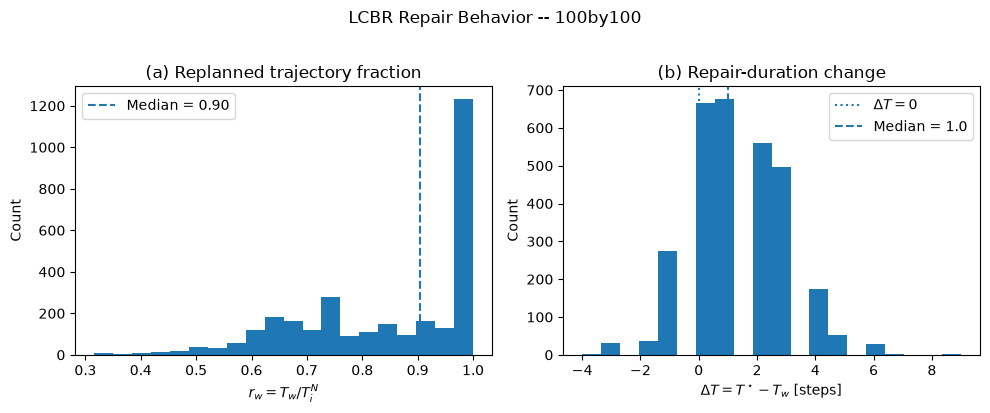

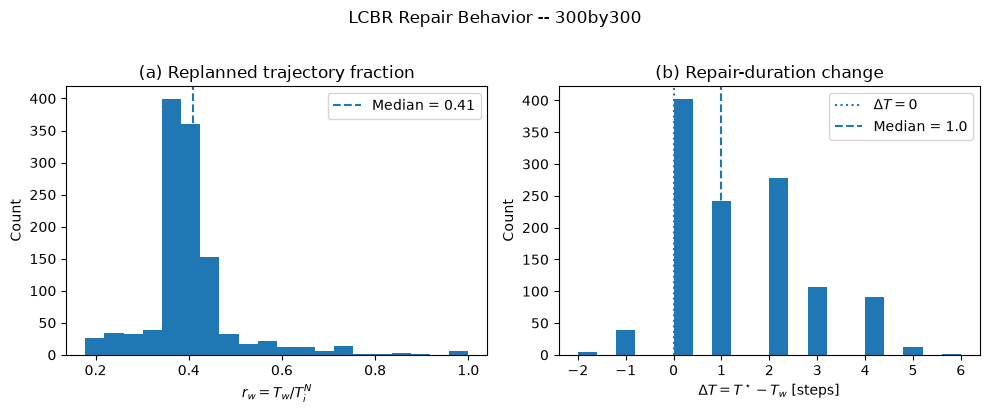

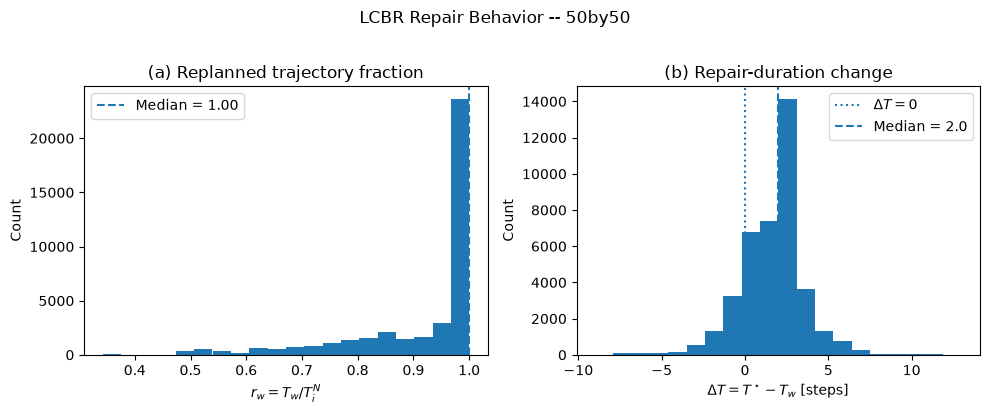

In [89]:
# ============================================================
# Figure 2 -- Repair-Window Fraction and Duration Change
# ============================================================

local_success = queries[
    (queries["method"] == "LCBR") &
    (queries["query_type"] == "local") &
    (queries["local_outcome"] == "success")
].copy()

local_success["map_size"] = (
    local_success["instance_id"].map(inst_to_map_size)
)

for map_size, grp in local_success.groupby("map_size"):

    rw = grp["window_fraction"].dropna()
    dt = grp["delta_T_repair"].dropna()

    if rw.empty or dt.empty:
        continue

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))

    # (a) Replanned fraction
    axes[0].hist(rw, bins=20)
    axes[0].axvline(
        rw.median(),
        linestyle="--",
        label=f"Median = {rw.median():.2f}"
    )
    axes[0].set_xlabel(r"$r_w = T_w/T_i^N$")
    axes[0].set_ylabel("Count")
    axes[0].set_title("(a) Replanned trajectory fraction")
    axes[0].legend()

    # (b) Duration change
    axes[1].hist(dt, bins=20)
    axes[1].axvline(
        0,
        linestyle=":",
        label=r"$\Delta T=0$"
    )
    axes[1].axvline(
        dt.median(),
        linestyle="--",
        label=f"Median = {dt.median():.1f}"
    )
    axes[1].set_xlabel(r"$\Delta T=T^\star-T_w$ [steps]")
    axes[1].set_ylabel("Count")
    axes[1].set_title("(b) Repair-duration change")
    axes[1].legend()

    fig.suptitle(
        f"LCBR Repair Behavior -- {map_size}",
        y=1.02
    )

    fig.tight_layout()
    plt.show()

## Layer 3 -- Repair-Window Ablation

This ablation evaluates the sensitivity of LCBR to its only additional
parameter, the repair margin $\delta_w$. The analysis measures the
trade-off between localization, local-repair success, fallback frequency,
low-level search effort, and solution quality.

The tested values are expressed relative to the temporal constraint
margin as

$$
\delta_w = \delta_T + kT_s.
$$

For each value, we report the replanned fraction $r_w$, local-repair
success and fallback rates, total SHA* expansions $E_{\mathrm{tot}}$,
Stage-3 runtime, and the relative change in solution quality.

## Layer 1 -- Figure 1: Computational Ratios vs. Number of Agents

This figure examines whether the relative computational behavior of LCBR
changes with team size. The analysis uses paired instances solved by both
methods and requiring active conflict resolution.

For each agent count, we report the median per-instance SHA* expansion
ratio

$$
R_E = \frac{E_{\mathrm{CL-CBS}}}{E_{\mathrm{LCBR}}},
$$

and Stage-3 runtime speedup

$$
S = \frac{t_{\mathrm{CL-CBS}}}{t_{\mathrm{LCBR}}}.
$$

Values above one favor LCBR, while values below one favor CL-CBS.


=== 100by100 ===


,num_agents,n,E_ratio_median,E_ratio_p25,E_ratio_p75,speedup_median,speedup_p25,speedup_p75
0,5,5,1.034265,1.002785,1.041187,1.071930,1.012118,1.102960
1,10,17,1.056075,1.011249,2.090909,1.079972,1.029462,1.845933
2,20,28,1.064450,0.962761,1.179305,1.085038,0.968436,1.194546
3,30,43,0.996124,0.822334,1.281059,1.002669,0.775891,1.214045


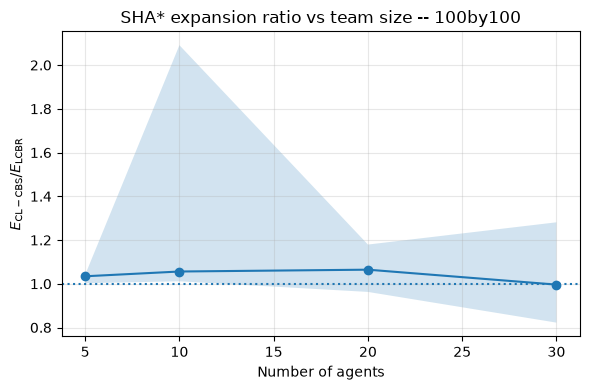

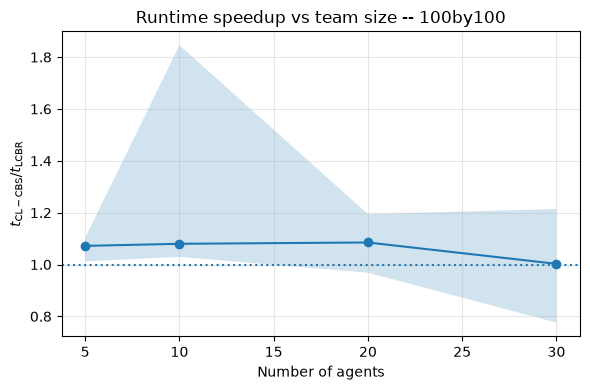


=== 300by300 ===


,num_agents,n,E_ratio_median,E_ratio_p25,E_ratio_p75,speedup_median,speedup_p25,speedup_p75
0,10,5,1.144144,1.109107,1.196667,1.151556,1.043847,1.203158
1,20,13,1.027696,1.012577,1.307865,1.038185,1.027276,1.238937
2,30,19,1.036005,0.794603,1.275080,1.039718,0.754703,1.198228


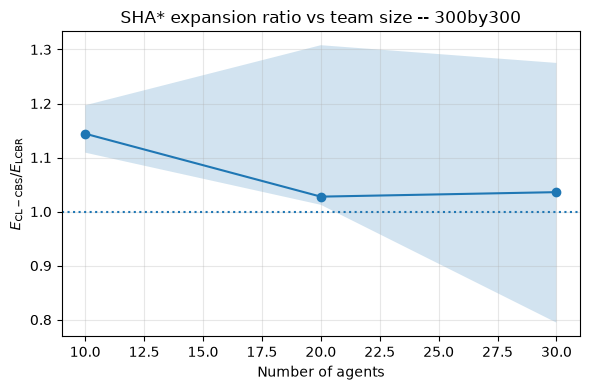

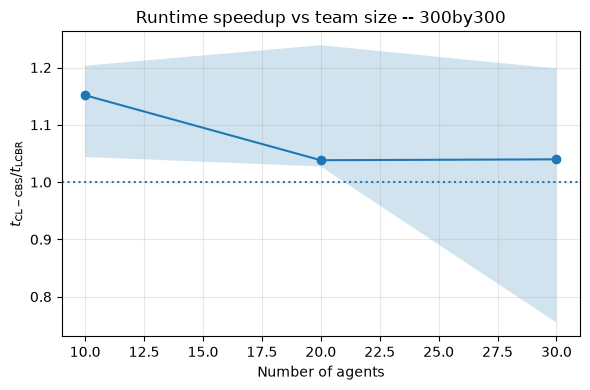


=== 50by50 ===


,num_agents,n,E_ratio_median,E_ratio_p25,E_ratio_p75,speedup_median,speedup_p25,speedup_p75
0,5,7,1.054054,1.000000,1.728425,1.329912,0.908078,1.594950
1,10,37,1.000000,0.972831,1.043478,0.988185,0.854527,1.018372
2,15,47,1.000000,0.971338,1.045593,0.985391,0.932921,1.080490
3,20,44,0.992992,0.880018,1.199795,0.986328,0.898768,1.168223


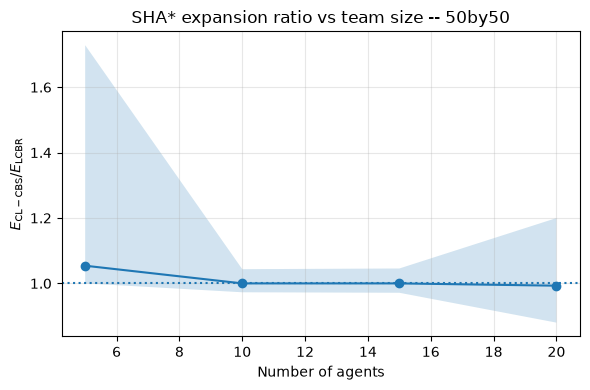

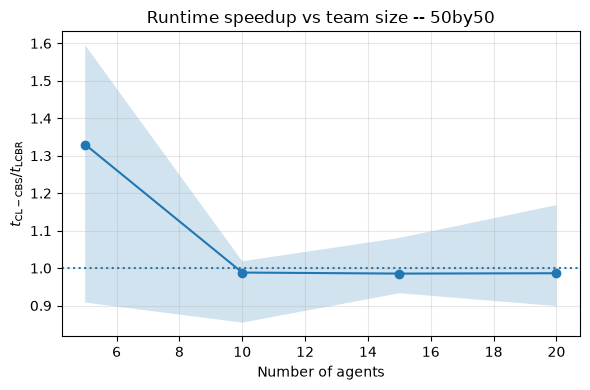

In [85]:
# ============================================================
# Figure 1 -- Computational ratios vs number of agents
# Active paired instances only
# ============================================================

for map_size in sorted(instances["map_size"].dropna().unique()):

    cc, ll = make_paired(
        instances[instances["map_size"] == map_size],
        delta_w=MAIN_DW
    )

    # Keep only instances where conflict resolution is active
    active = (cc["N_LL"] > 0) | (ll["N_LL"] > 0)

    cc = cc.loc[active].copy()
    ll = ll.loc[active].copy()

    if cc.empty:
        continue

    ratios = pd.DataFrame(index=cc.index)

    ratios["num_agents"] = cc["num_agents"]

    ratios["E_ratio"] = (
        cc["E_tot"] /
        ll["E_tot"].replace(0, np.nan)
    )

    ratios["speedup"] = (
        cc["conflict_resolution_runtime_s"] /
        ll["conflict_resolution_runtime_s"].replace(0, np.nan)
    )

    # Median per-instance ratios by agent count
    summary = (
        ratios
        .groupby("num_agents")
        .agg(
            n=("E_ratio", "count"),

            E_ratio_median=("E_ratio", "median"),
            E_ratio_p25=("E_ratio", lambda x: x.quantile(0.25)),
            E_ratio_p75=("E_ratio", lambda x: x.quantile(0.75)),

            speedup_median=("speedup", "median"),
            speedup_p25=("speedup", lambda x: x.quantile(0.25)),
            speedup_p75=("speedup", lambda x: x.quantile(0.75)),
        )
        .reset_index()
    )

    print(f"\n=== {map_size} ===")
    display(summary)

    # --------------------------------------------------------
    # Expansion ratio
    # --------------------------------------------------------

    fig, ax = plt.subplots(figsize=(6, 4))

    ax.plot(
        summary["num_agents"],
        summary["E_ratio_median"],
        marker="o"
    )

    ax.fill_between(
        summary["num_agents"],
        summary["E_ratio_p25"],
        summary["E_ratio_p75"],
        alpha=0.2
    )

    ax.axhline(1.0, linestyle=":")

    ax.set_xlabel("Number of agents")
    ax.set_ylabel(
        r"$E_{\mathrm{CL-CBS}}/E_{\mathrm{LCBR}}$"
    )

    ax.set_title(
        f"SHA* expansion ratio vs team size -- {map_size}"
    )

    ax.grid(alpha=0.3)

    fig.tight_layout()
    plt.show()

    # --------------------------------------------------------
    # Runtime speedup
    # --------------------------------------------------------

    fig, ax = plt.subplots(figsize=(6, 4))

    ax.plot(
        summary["num_agents"],
        summary["speedup_median"],
        marker="o"
    )

    ax.fill_between(
        summary["num_agents"],
        summary["speedup_p25"],
        summary["speedup_p75"],
        alpha=0.2
    )

    ax.axhline(1.0, linestyle=":")

    ax.set_xlabel("Number of agents")
    ax.set_ylabel(
        r"$t_{\mathrm{CL-CBS}}/t_{\mathrm{LCBR}}$"
    )

    ax.set_title(
        f"Runtime speedup vs team size -- {map_size}"
    )

    ax.grid(alpha=0.3)

    fig.tight_layout()
    plt.show()


=== 50by50 ===


,num_agents,n,E_ratio_median,E_ratio_p25,E_ratio_p75,speedup_median,speedup_p25,speedup_p75
0,5,7,1.054054,1.000000,1.728425,1.329912,0.908078,1.594950
1,10,37,1.000000,0.972831,1.043478,0.988185,0.854527,1.018372
2,15,47,1.000000,0.971338,1.045593,0.985391,0.932921,1.080490
3,20,44,0.992992,0.880018,1.199795,0.986328,0.898768,1.168223



=== 100by100 ===


,num_agents,n,E_ratio_median,E_ratio_p25,E_ratio_p75,speedup_median,speedup_p25,speedup_p75
0,5,5,1.034265,1.002785,1.041187,1.071930,1.012118,1.102960
1,10,17,1.056075,1.011249,2.090909,1.079972,1.029462,1.845933
2,20,28,1.064450,0.962761,1.179305,1.085038,0.968436,1.194546
3,30,43,0.996124,0.822334,1.281059,1.002669,0.775891,1.214045



=== 300by300 ===


,num_agents,n,E_ratio_median,E_ratio_p25,E_ratio_p75,speedup_median,speedup_p25,speedup_p75
0,10,5,1.144144,1.109107,1.196667,1.151556,1.043847,1.203158
1,20,13,1.027696,1.012577,1.307865,1.038185,1.027276,1.238937
2,30,19,1.036005,0.794603,1.275080,1.039718,0.754703,1.198228


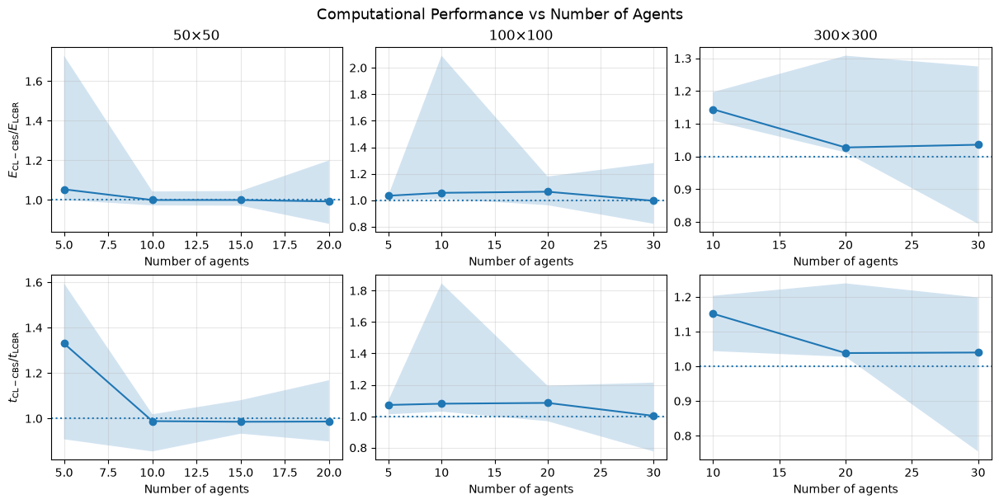

In [91]:
# ============================================================
# Figure 1 -- Computational Performance vs Number of Agents
# Publication version: 2 rows x 3 map sizes
# Active paired instances only
# ============================================================

map_order = ["50by50", "100by100", "300by300"]

fig, axes = plt.subplots(
    2, 3,
    figsize=(12, 6),
    constrained_layout=True
)

for col, map_size in enumerate(map_order):

    # --------------------------------------------------------
    # Paired common-success instances
    # --------------------------------------------------------

    cc, ll = make_paired(
        instances[instances["map_size"] == map_size],
        delta_w=MAIN_DW
    )

    # Keep only instances with active conflict resolution
    active = (cc["N_LL"] > 0) | (ll["N_LL"] > 0)

    cc = cc.loc[active].copy()
    ll = ll.loc[active].copy()

    if cc.empty:
        axes[0, col].set_visible(False)
        axes[1, col].set_visible(False)
        continue

    # --------------------------------------------------------
    # Per-instance paired ratios
    # --------------------------------------------------------

    ratios = pd.DataFrame(index=cc.index)

    ratios["num_agents"] = cc["num_agents"]

    # > 1 means fewer total SHA* expansions with LCBR
    ratios["E_ratio"] = (
        cc["E_tot"] /
        ll["E_tot"].replace(0, np.nan)
    )

    # > 1 means LCBR is faster
    ratios["speedup"] = (
        cc["conflict_resolution_runtime_s"] /
        ll["conflict_resolution_runtime_s"].replace(0, np.nan)
    )

    # --------------------------------------------------------
    # Median + IQR by agent count
    # --------------------------------------------------------

    summary = (
        ratios
        .groupby("num_agents")
        .agg(
            n=("E_ratio", "count"),

            E_ratio_median=("E_ratio", "median"),
            E_ratio_p25=("E_ratio", lambda x: x.quantile(0.25)),
            E_ratio_p75=("E_ratio", lambda x: x.quantile(0.75)),

            speedup_median=("speedup", "median"),
            speedup_p25=("speedup", lambda x: x.quantile(0.25)),
            speedup_p75=("speedup", lambda x: x.quantile(0.75)),
        )
        .reset_index()
    )

    print(f"\n=== {map_size} ===")
    display(summary)

    # ========================================================
    # TOP ROW -- SHA* expansion ratio
    # ========================================================

    ax = axes[0, col]

    ax.plot(
        summary["num_agents"],
        summary["E_ratio_median"],
        marker="o"
    )

    ax.fill_between(
        summary["num_agents"],
        summary["E_ratio_p25"],
        summary["E_ratio_p75"],
        alpha=0.2
    )

    # Neutral reference: CL-CBS = LCBR
    ax.axhline(
        1.0,
        linestyle=":"
    )

    ax.set_title(
        map_size.replace("by", r"$\times$")
    )

    ax.set_xlabel("Number of agents")

    if col == 0:
        ax.set_ylabel(
            r"$E_{\mathrm{CL-CBS}}/E_{\mathrm{LCBR}}$"
        )

    ax.grid(alpha=0.3)

    # ========================================================
    # BOTTOM ROW -- Runtime speedup
    # ========================================================

    ax = axes[1, col]

    ax.plot(
        summary["num_agents"],
        summary["speedup_median"],
        marker="o"
    )

    ax.fill_between(
        summary["num_agents"],
        summary["speedup_p25"],
        summary["speedup_p75"],
        alpha=0.2
    )

    # Neutral reference: same runtime
    ax.axhline(
        1.0,
        linestyle=":"
    )

    ax.set_xlabel("Number of agents")

    if col == 0:
        ax.set_ylabel(
            r"$t_{\mathrm{CL-CBS}}/t_{\mathrm{LCBR}}$"
        )

    ax.grid(alpha=0.3)


# ============================================================
# Global title
# ============================================================

fig.suptitle(
    "Computational Performance vs Number of Agents",
    fontsize=13
)

plt.show()

## Layer 0/1 -- Validation: 0 collisions expected

Reads `results/tables/validation_report.csv`, written by
`analysis/validate_solutions.py --run-dir <run> --vehicle-config
../config/vehicle_config.yaml` (run separately first -- it independently
re-parses each solution YAML and re-checks C3b/C4/C5 from scratch; it
does not trust `instance_metrics.csv`'s own `success` flag). This
notebook only summarizes an existing report.


In [36]:
val_path = os.path.join(REPO_ROOT, "results", "tables", "validation_report.csv")
if not os.path.exists(val_path):
    print(f"{val_path} not found -- run:\n"
         f"  python3 validate_solutions.py --run-dir <a runs/main_comparison/... "
         f"you want to check> --vehicle-config ../config/vehicle_config.yaml")
else:
    val = pd.read_csv(val_path)
    print(f"{len(val)} solutions checked.")
    print(val[["C4_obstacle", "C4_bounds", "C5_interrobot", "C3b_kinematic", "total_violations"]].sum())
    bad = val[val.total_violations > 0]
    if len(bad):
        print(f"\n{len(bad)} solution(s) with violations:")
        display(bad)
    else:
        print("\nAll checked solutions: 0 violations of C3b/C4/C5.")


73 solutions checked.
C4_obstacle         10
C4_bounds            0
C5_interrobot        0
C3b_kinematic        0
total_violations    10
dtype: int64

10 solution(s) with violations:


,solution_filename,method,delta_w,n_agents,n_states,C4_obstacle,C4_bounds,C5_interrobot,C3b_kinematic,total_violations
4,map_50by50_obst25_agents5_ex10_clcbs.yaml,clcbs,NaN,5,61,1,0,0,0,1
5,map_50by50_obst25_agents5_ex10_lcbr_dw10.yaml,lcbr,10.0,5,61,1,0,0,0,1
28,map_50by50_obst25_agents10_ex12_clcbs.yaml,clcbs,NaN,10,110,1,0,0,0,1
29,map_50by50_obst25_agents10_ex12_lcbr_dw10.yaml,lcbr,10.0,10,110,1,0,0,0,1
46,map_50by50_obst25_agents15_ex12_clcbs.yaml,clcbs,NaN,15,169,1,0,0,0,1
47,map_50by50_obst25_agents15_ex12_lcbr_dw10.yaml,lcbr,10.0,15,169,1,0,0,0,1
56,map_50by50_obst25_agents20_ex0_clcbs.yaml,clcbs,NaN,20,203,1,0,0,0,1
57,map_50by50_obst25_agents20_ex0_lcbr_dw10.yaml,lcbr,10.0,20,201,1,0,0,0,1
65,map_50by50_obst25_agents20_ex13_clcbs.yaml,clcbs,NaN,20,179,1,0,0,0,1
66,map_50by50_obst25_agents20_ex13_lcbr_dw10.yaml,lcbr,10.0,20,180,1,0,0,0,1


## Layer 2 -- Why does it work? Table III: LCBR mechanism

Adds two checks previous versions of this notebook skipped:
- **`E_bar_full` sanity check**: LCBR's fallback full-horizon calls
  should cost about the same per call as CL-CBS's own full-horizon
  calls. A large deviation (e.g. off by >2x) would flag a
  constraint-transmission discrepancy between the two code paths rather
  than a genuine algorithmic difference -- this checks that the fallback
  really is "the same CL-CBS code", not an accidental variant.
- **window clipping rate**: how often the repair window hits a
  trajectory boundary ($t^-=0$ or $t^+=T_i^N$).


In [37]:
def mechanism_summary(q):
    n_local_query = (q.local_outcome.isin(["success", "fail"])).sum()
    n_success = (q.local_outcome == "success").sum()
    n_fail = (q.local_outcome == "fail").sum()
    n_inapplicable = (q.local_outcome == "inapplicable").sum()
    n_branch = n_local_query + n_inapplicable

    r_success = n_success / n_local_query if n_local_query else np.nan
    r_inapplicable = n_inapplicable / n_branch if n_branch else np.nan

    failed_local = q[(q.query_type == "local") & (q.local_outcome == "fail")]
    E_wasted = failed_local.sha_expansions.sum()
    E_total_lcbr = q.sha_expansions.sum()
    r_wasted = E_wasted / E_total_lcbr if E_total_lcbr else np.nan

    full_fallback = q[(q.query_type == "full") & (q.fallback_triggered == True)]
    n_branch_full = n_branch if n_branch else np.nan
    r_fallback = len(full_fallback) / n_branch_full if n_branch_full else np.nan

    local_success = q[(q.query_type == "local") & (q.local_outcome == "success")]
    clip_left = local_success.clipped_left.mean() if len(local_success) else np.nan
    clip_right = local_success.clipped_right.mean() if len(local_success) else np.nan

    E_bar_local = local_success.sha_expansions.mean() if len(local_success) else np.nan
    E_bar_full_fallback = full_fallback.sha_expansions.mean() if len(full_fallback) else np.nan

    return {
        "n_success": n_success, "n_fail": n_fail, "n_inapplicable": n_inapplicable,
        "r_success": r_success, "r_inapplicable": r_inapplicable, "r_fallback": r_fallback,
        "E_bar_local": E_bar_local, "E_wasted": E_wasted, "r_wasted": r_wasted,
        "clip_left_rate": clip_left, "clip_right_rate": clip_right,
        "E_bar_full_LCBR_fallback": E_bar_full_fallback,
    }

inst_to_map_size = instances.drop_duplicates("instance_id").set_index("instance_id").map_size

rows = []
for map_size in sorted(instances.map_size.dropna().unique()):
    ids_this_size = inst_to_map_size[inst_to_map_size == map_size].index
    q_lcbr = queries[(queries.instance_id.isin(ids_this_size)) & (queries.method == "LCBR")]
    if q_lcbr.empty:
        continue
    summary = mechanism_summary(q_lcbr)
    summary["map_size"] = map_size

    # Sanity check: LCBR's fallback E_bar_full vs CL-CBS's own baseline E_bar_full.
    q_clcbs_full = queries[(queries.instance_id.isin(ids_this_size)) &
                           (queries.method == "CL-CBS") & (queries.query_type == "full")]
    summary["E_bar_full_CLCBS_baseline"] = q_clcbs_full.sha_expansions.mean() if len(q_clcbs_full) else np.nan
    summary["sanity_ratio (should be close to 1.0)"] = (
        summary["E_bar_full_LCBR_fallback"] / summary["E_bar_full_CLCBS_baseline"]
        if summary["E_bar_full_CLCBS_baseline"] not in (0, None) and not pd.isna(summary["E_bar_full_CLCBS_baseline"])
        else np.nan
    )
    rows.append(summary)

table3 = pd.DataFrame(rows).set_index("map_size") if rows else pd.DataFrame()
table3


,n_success,n_fail,n_inapplicable,r_success,r_inapplicable,r_fallback,E_bar_local,E_wasted,r_wasted,clip_left_rate,clip_right_rate,E_bar_full_LCBR_fallback,E_bar_full_CLCBS_baseline,sanity_ratio (should be close to 1.0)
map_size,,,,,,,,,,,,,,
100by100,3003,0,681,1.000000,0.184853,0.184853,150.421245,0,0.000000,0.556777,0.587080,2417.052863,554.472307,4.359195
300by300,1175,0,81,1.000000,0.064490,0.064490,206.686809,0,0.000000,0.071489,0.114043,80908.419753,6307.733813,12.826860
50by50,40023,146,8747,0.996365,0.178817,0.181801,260.549484,8838,0.000507,0.843590,0.580841,787.771168,564.260580,1.396112


## Layer 2 -- Figure 2: Repair-Window Fraction and Duration Change

This analysis characterizes the effective extent of local repair.
The replanned fraction

$$
r_w = \frac{T_w}{T_i^N}
$$

measures how much of the current trajectory is covered by the repair
window, while

$$
\Delta T = T^\star - T_w
$$

measures the duration change introduced by the repaired segment.

Results are reported separately by map size using the median and IQR of
$r_w$ and $\Delta T$, together with the fractions of repairs for which
$\Delta T<0$, $\Delta T=0$, and $\Delta T>0$. The distributions reveal
how the effective degree of localization varies with trajectory scale.

Successful local repairs (all map sizes): 44201

=== map_size=100by100 (n=3003) ===
  r_w:     median=0.905  IQR=[0.720, 1.000]
  delta_T: median=1.00  IQR=[0.00, 3.00]
           P(<0)=0.114  P(=0)=0.222  P(>0)=0.664


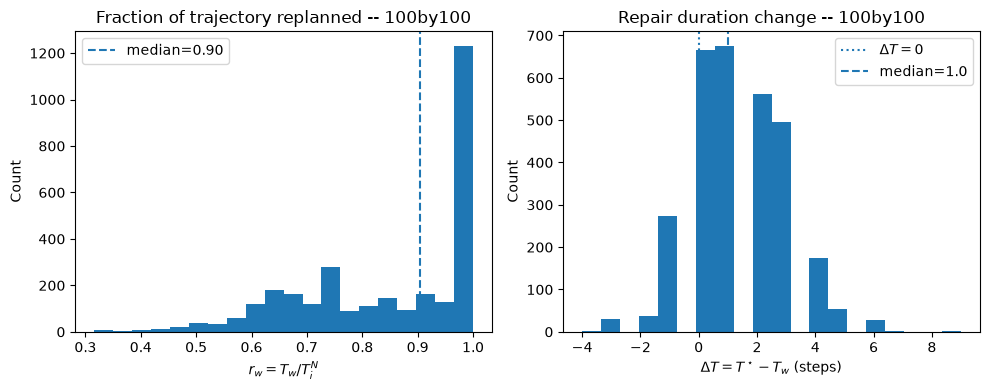


=== map_size=300by300 (n=1175) ===
  r_w:     median=0.408  IQR=[0.364, 0.417]
  delta_T: median=1.00  IQR=[0.00, 2.00]
           P(<0)=0.037  P(=0)=0.342  P(>0)=0.621


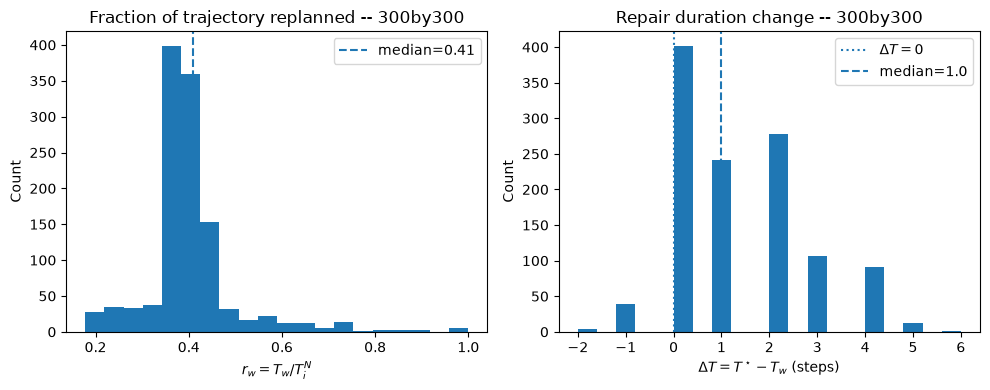


=== map_size=50by50 (n=40023) ===
  r_w:     median=1.000  IQR=[0.864, 1.000]
  delta_T: median=2.00  IQR=[0.00, 3.00]
           P(<0)=0.138  P(=0)=0.170  P(>0)=0.692


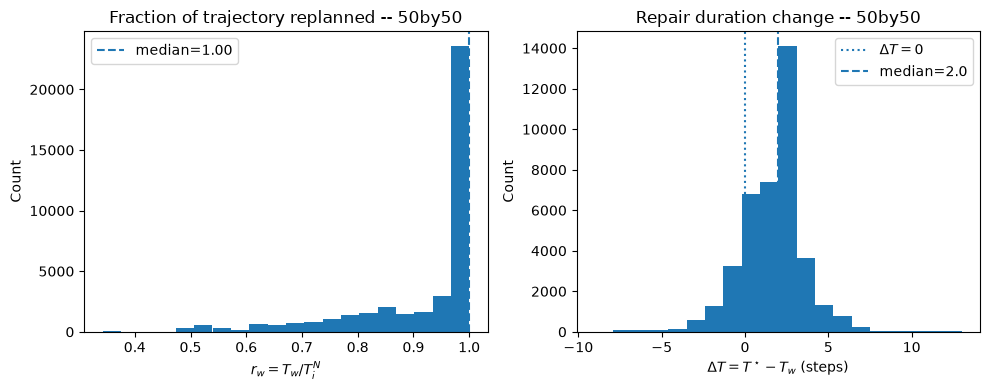

In [73]:
# ============================================================
# Layer 2 -- Figure 2:
# Repair-window fraction and duration change
# ============================================================

local_success = queries[
    (queries["method"] == "LCBR") &
    (queries["query_type"] == "local") &
    (queries["local_outcome"] == "success")
].copy()

# Attach map size to each query
local_success["map_size"] = (
    local_success["instance_id"].map(inst_to_map_size)
)

print(
    f"Successful local repairs (all map sizes): "
    f"{len(local_success)}"
)

for map_size, grp in local_success.groupby("map_size"):

    rw = grp["window_fraction"].dropna()
    dt = grp["delta_T_repair"].dropna()

    if rw.empty:
        continue

    # --------------------------------------------------------
    # Numerical summary
    # --------------------------------------------------------

    print(f"\n=== map_size={map_size} (n={len(grp)}) ===")

    print(
        f"  r_w:     median={rw.median():.3f}  "
        f"IQR=[{rw.quantile(0.25):.3f}, "
        f"{rw.quantile(0.75):.3f}]"
    )

    if not dt.empty:

        frac_neg = (dt < 0).mean()
        frac_zero = (dt == 0).mean()
        frac_pos = (dt > 0).mean()

        print(
            f"  delta_T: median={dt.median():.2f}  "
            f"IQR=[{dt.quantile(0.25):.2f}, "
            f"{dt.quantile(0.75):.2f}]"
        )

        print(
            f"           P(<0)={frac_neg:.3f}  "
            f"P(=0)={frac_zero:.3f}  "
            f"P(>0)={frac_pos:.3f}"
        )

    # --------------------------------------------------------
    # Figure
    # --------------------------------------------------------

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))

    # r_w distribution
    axes[0].hist(rw, bins=20)

    axes[0].axvline(
        rw.median(),
        linestyle="--",
        label=f"median={rw.median():.2f}"
    )

    axes[0].set_xlabel(r"$r_w = T_w / T_i^N$")
    axes[0].set_ylabel("Count")
    axes[0].set_title(
        f"Fraction of trajectory replanned -- {map_size}"
    )
    axes[0].legend()

    # Delta T distribution
    if not dt.empty:

        axes[1].hist(dt, bins=20)

        axes[1].axvline(
            0,
            linestyle=":",
            label=r"$\Delta T=0$"
        )

        axes[1].axvline(
            dt.median(),
            linestyle="--",
            label=f"median={dt.median():.1f}"
        )

        axes[1].set_xlabel(
            r"$\Delta T = T^\star - T_w$ (steps)"
        )
        axes[1].set_ylabel("Count")
        axes[1].set_title(
            f"Repair duration change -- {map_size}"
        )
        axes[1].legend()

    fig.tight_layout()
    plt.show()

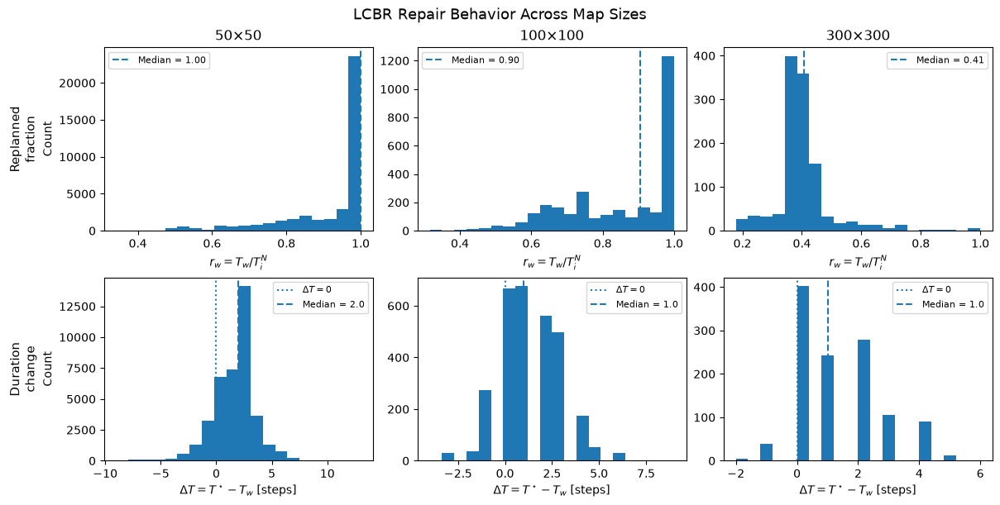

In [90]:
# ============================================================
# Figure 2 -- Repair Behavior Across Map Sizes
# One publication-ready 2x3 figure
# ============================================================

local_success = queries[
    (queries["method"] == "LCBR") &
    (queries["query_type"] == "local") &
    (queries["local_outcome"] == "success")
].copy()

local_success["map_size"] = (
    local_success["instance_id"].map(inst_to_map_size)
)

# Desired column order
map_order = ["50by50", "100by100", "300by300"]

fig, axes = plt.subplots(
    2, 3,
    figsize=(12, 6),
    constrained_layout=True
)

for col, map_size in enumerate(map_order):

    grp = local_success[
        local_success["map_size"] == map_size
    ]

    rw = grp["window_fraction"].dropna()
    dt = grp["delta_T_repair"].dropna()

    # ========================================================
    # Top row -- replanned fraction r_w
    # ========================================================

    ax = axes[0, col]

    if not rw.empty:

        ax.hist(
            rw,
            bins=20
        )

        ax.axvline(
            rw.median(),
            linestyle="--",
            label=f"Median = {rw.median():.2f}"
        )

    ax.set_title(
        f"{map_size.replace('by', r'$\times$')}"
    )

    ax.set_xlabel(
        r"$r_w = T_w/T_i^N$"
    )

    if col == 0:
        ax.set_ylabel("Count")

    ax.legend(fontsize=8)

    # ========================================================
    # Bottom row -- duration change Delta T
    # ========================================================

    ax = axes[1, col]

    if not dt.empty:

        ax.hist(
            dt,
            bins=20
        )

        ax.axvline(
            0,
            linestyle=":",
            label=r"$\Delta T=0$"
        )

        ax.axvline(
            dt.median(),
            linestyle="--",
            label=f"Median = {dt.median():.1f}"
        )

    ax.set_xlabel(
        r"$\Delta T = T^\star-T_w$ [steps]"
    )

    if col == 0:
        ax.set_ylabel("Count")

    ax.legend(fontsize=8)


# Row labels
axes[0, 0].text(
    -0.30, 0.5,
    "Replanned\nfraction",
    transform=axes[0, 0].transAxes,
    rotation=90,
    va="center",
    ha="center",
    fontsize=11
)

axes[1, 0].text(
    -0.30, 0.5,
    "Duration\nchange",
    transform=axes[1, 0].transAxes,
    rotation=90,
    va="center",
    ha="center",
    fontsize=11
)

fig.suptitle(
    "LCBR Repair Behavior Across Map Sizes",
    fontsize=13
)

plt.show()


## Layer 3 -- Repair-Window Ablation

This experiment evaluates the sensitivity of LCBR to the repair margin
$\delta_w$. Each value of $\delta_w$ is evaluated on the same set of
instances, allowing paired comparison of computational effort, local-repair
behavior, and solution quality.

The analysis examines whether reducing the repair window decreases SHA*
search effort while maintaining a high local-repair success rate, and
whether a common operating region exists across map sizes.


In [74]:
# ============================================================
# Layer 3 -- Repair-Window Ablation
# Requires separate delta_w_ablation runs
# ============================================================

if not DELTA_W_ABLATION_RUN_DIRS:

    print(
        "No delta_w_ablation run found.\n"
        "Set DELTA_W_ABLATION_RUN_DIRS in the first code cell "
        "once the ablation runs are available."
    )

else:

    # --------------------------------------------------------
    # Load ablation data separately from main comparison
    # --------------------------------------------------------

    dw_instances, dw_queries = _load.merge_runs(
        DELTA_W_ABLATION_RUN_DIRS
    )

    dw_instances["map_size"] = (
        dw_instances["instance_id"]
        .str.extract(r"map_(\d+by\d+)_")
    )

    # Map size for query-level data
    dw_inst_to_map = (
        dw_instances[["instance_id", "map_size"]]
        .drop_duplicates("instance_id")
        .set_index("instance_id")["map_size"]
    )

    if dw_queries is not None and not dw_queries.empty:
        dw_queries["map_size"] = (
            dw_queries["instance_id"].map(dw_inst_to_map)
        )

    # LCBR only
    dw_lcbr = dw_instances[
        dw_instances["method"] == "LCBR"
    ].copy()

    delta_values = sorted(
        dw_lcbr["delta_w_steps"].dropna().unique()
    )

    print("delta_w values found:", delta_values)

    if len(delta_values) <= 1:

        print(
            "Only one delta_w value is present -- "
            "nothing to ablate."
        )

    else:

        # ----------------------------------------------------
        # Instance-level rates
        # ----------------------------------------------------

        N_local_query = (
            dw_lcbr["N_success"] +
            dw_lcbr["N_fail"]
        )

        N_branch = (
            dw_lcbr["N_success"] +
            dw_lcbr["N_fail"] +
            dw_lcbr["N_inapplicable"]
        )

        dw_lcbr["r_success"] = (
            dw_lcbr["N_success"] /
            N_local_query.replace(0, np.nan)
        )

        dw_lcbr["r_fallback"] = (
            dw_lcbr["N_full_fallback"] /
            N_branch.replace(0, np.nan)
        )

        # Nominal -> final change.
        # This is NOT the LCBR-vs-CL-CBS quality difference.
        dw_lcbr["delta_SoC_nominal_pct"] = (
            100.0 *
            (
                dw_lcbr["SoC_final"] -
                dw_lcbr["SoC_nominal"]
            ) /
            dw_lcbr["SoC_nominal"].replace(0, np.nan)
        )

        # ----------------------------------------------------
        # Query-level metrics
        # ----------------------------------------------------

        query_rows = []

        if dw_queries is not None and not dw_queries.empty:

            q_lcbr = dw_queries[
                dw_queries["method"] == "LCBR"
            ].copy()

            # delta_w may not be stored directly in queries.
            # Recover it from the source run / instance data if needed.
            if "delta_w_steps" not in q_lcbr.columns:

                instance_dw = (
                    dw_lcbr[
                        [
                            "instance_id",
                            "delta_w_steps",
                            "_source_run_dir"
                        ]
                    ]
                    .drop_duplicates()
                )

                # Prefer run-aware matching because the same instance
                # appears once for each delta_w.
                if "_source_run_dir" in q_lcbr.columns:

                    q_lcbr = q_lcbr.merge(
                        instance_dw,
                        on=["instance_id", "_source_run_dir"],
                        how="left"
                    )

            for (map_size, delta_w), q in q_lcbr.groupby(
                ["map_size", "delta_w_steps"]
            ):

                local_success = q[
                    (q["query_type"] == "local") &
                    (q["local_outcome"] == "success")
                ]

                local_fail = q[
                    (q["query_type"] == "local") &
                    (q["local_outcome"] == "fail")
                ]

                local_attempted = q[
                    (q["query_type"] == "local") &
                    (q["local_outcome"].isin(["success", "fail"]))
                ]

                full = q[
                    q["query_type"] == "full"
                ]

                E_wasted = local_fail["sha_expansions"].sum()
                E_all = q["sha_expansions"].sum()

                rw = local_success["window_fraction"].dropna()

                query_rows.append({
                    "map_size": map_size,
                    "delta_w_steps": delta_w,

                    "N_local_success":
                        len(local_success),

                    "N_local_fail":
                        len(local_fail),

                    "N_full":
                        len(full),

                    "r_success_query":
                        (
                            len(local_success) /
                            len(local_attempted)
                            if len(local_attempted)
                            else np.nan
                        ),

                    "E_local_median":
                        local_success[
                            "sha_expansions"
                        ].median(),

                    "E_full_median":
                        full[
                            "sha_expansions"
                        ].median(),

                    "E_wasted":
                        E_wasted,

                    "r_wasted":
                        (
                            E_wasted / E_all
                            if E_all > 0
                            else np.nan
                        ),

                    "r_w_median":
                        rw.median(),

                    "r_w_p25":
                        rw.quantile(0.25),

                    "r_w_p75":
                        rw.quantile(0.75),
                })

        query_summary = pd.DataFrame(query_rows)

        # ----------------------------------------------------
        # Main ablation table
        # ----------------------------------------------------

        table4 = (
            dw_lcbr
            .groupby(
                ["map_size", "delta_w_steps"]
            )
            .agg(
                n=("instance_id", "count"),

                success_pct=(
                    "success",
                    lambda x: 100 * x.mean()
                ),

                runtime_median_s=(
                    "conflict_resolution_runtime_s",
                    "median"
                ),

                E_tot_median=(
                    "E_tot",
                    "median"
                ),

                r_success_median=(
                    "r_success",
                    "median"
                ),

                r_fallback_median=(
                    "r_fallback",
                    "median"
                ),

                delta_SoC_nominal_pct_median=(
                    "delta_SoC_nominal_pct",
                    "median"
                ),
            )
            .reset_index()
        )

        if not query_summary.empty:

            table4 = table4.merge(
                query_summary,
                on=["map_size", "delta_w_steps"],
                how="left"
            )

        print("\n=== Repair-window ablation ===")
        display(table4)

No delta_w_ablation run found.
Set DELTA_W_ABLATION_RUN_DIRS in the first code cell once the ablation runs are available.


In [76]:
# ============================================================
# Layer 3 -- Repair-window ablation figures
# ============================================================

if "table4" not in globals() or table4.empty:

    print(
        "Repair-window ablation figures skipped: "
        "no delta_w ablation data available."
    )

else:

    for map_size, t in table4.groupby("map_size"):

        t = t.sort_values("delta_w_steps")

        # ----------------------------------------------------
        # Figure A -- Computational effort
        # ----------------------------------------------------

        fig, ax = plt.subplots(figsize=(6, 4))

        ax.plot(
            t["delta_w_steps"],
            t["E_tot_median"],
            marker="o",
            label=r"$E_{\mathrm{tot}}$"
        )

        ax.set_xlabel(r"$\delta_w$ (steps)")
        ax.set_ylabel("Median SHA* expansions")
        ax.set_title(
            f"Search effort vs repair margin -- {map_size}"
        )

        ax.legend()
        ax.grid(alpha=0.3)

        fig.tight_layout()
        plt.show()

        # ----------------------------------------------------
        # Figure B -- Repair behavior
        # ----------------------------------------------------

        fig, ax = plt.subplots(figsize=(6, 4))

        ax.plot(
            t["delta_w_steps"],
            t["r_success_median"],
            marker="o",
            label=r"$r_{\mathrm{success}}$"
        )

        ax.plot(
            t["delta_w_steps"],
            t["r_fallback_median"],
            marker="s",
            label=r"$r_{\mathrm{fallback}}$"
        )

        if "r_w_median" in t.columns:
            ax.plot(
                t["delta_w_steps"],
                t["r_w_median"],
                marker="^",
                label=r"$r_w$"
            )

        ax.set_xlabel(r"$\delta_w$ (steps)")
        ax.set_ylabel("Rate / fraction")
        ax.set_title(
            f"Repair behavior vs repair margin -- {map_size}"
        )

        ax.legend()
        ax.grid(alpha=0.3)

        fig.tight_layout()
        plt.show()

Repair-window ablation figures skipped: no delta_w ablation data available.


## Layer 3 -- Effect of Conflict-Resolution Difficulty

We examine whether the relative benefit of LCBR depends on the amount of
conflict-resolution effort required by the baseline.

The quantity `bct_nodes_expanded - 1` from CL-CBS is used as a
baseline-derived indicator of conflict-resolution difficulty. It is not
interpreted as the number of physical conflicts, since it depends on the
conflict-selection and BCT expansion process.

The analysis is restricted to instances solved by both methods and
requiring active conflict resolution. For each instance, we examine the
Stage-3 speedup

$$
S = \frac{t_{\mathrm{CL-CBS}}}{t_{\mathrm{LCBR}}},
$$

and the total SHA* expansion ratio

$$
R_E = \frac{E_{\mathrm{CL-CBS}}}{E_{\mathrm{LCBR}}}.
$$

Values above one favor LCBR.

In [77]:
# ============================================================
# Layer 3 -- Effect of Conflict-Resolution Difficulty
# ============================================================

difficulty_rows = []

for map_size in sorted(instances["map_size"].dropna().unique()):

    cc, ll = make_paired(
        instances[instances["map_size"] == map_size],
        delta_w=MAIN_DW
    )

    # Keep only instances with active conflict resolution
    active = (cc["N_LL"] > 0) | (ll["N_LL"] > 0)

    cc = cc.loc[active].copy()
    ll = ll.loc[active].copy()

    if cc.empty:
        continue

    d = pd.DataFrame(index=cc.index)

    d["map_size"] = map_size

    # Baseline-derived conflict-resolution difficulty
    d["baseline_BCT_effort"] = (
        cc["bct_nodes_expanded"] - 1
    )

    # Stage-3 runtime speedup
    d["speedup"] = (
        cc["conflict_resolution_runtime_s"] /
        ll["conflict_resolution_runtime_s"].replace(0, np.nan)
    )

    # Total SHA* expansion ratio
    d["E_ratio"] = (
        cc["E_tot"] /
        ll["E_tot"].replace(0, np.nan)
    )

    # Difference in number of low-level queries
    d["N_LL_ratio"] = (
        ll["N_LL"] /
        cc["N_LL"].replace(0, np.nan)
    )

    difficulty_rows.append(d)


difficulty = pd.concat(difficulty_rows)

print(
    "Active paired instances:",
    len(difficulty)
)

display(
    difficulty[
        [
            "map_size",
            "baseline_BCT_effort",
            "speedup",
            "E_ratio",
            "N_LL_ratio",
        ]
    ].describe()
)

Active paired instances: 265


,baseline_BCT_effort,speedup,E_ratio,N_LL_ratio
count,265.000000,265.000000,265.000000,265.000000
mean,25.615094,1.469470,1.741126,1.164958
std,117.388192,4.640881,8.460485,0.713673
min,1.000000,0.115952,0.083656,0.104167
25%,1.000000,0.930179,0.961165,1.000000
50%,3.000000,1.019523,1.000000,1.000000
75%,11.000000,1.163863,1.145455,1.000000
max,1567.000000,74.228120,136.799136,7.000000


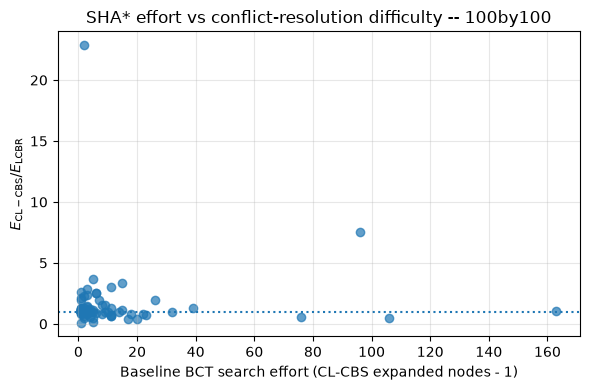

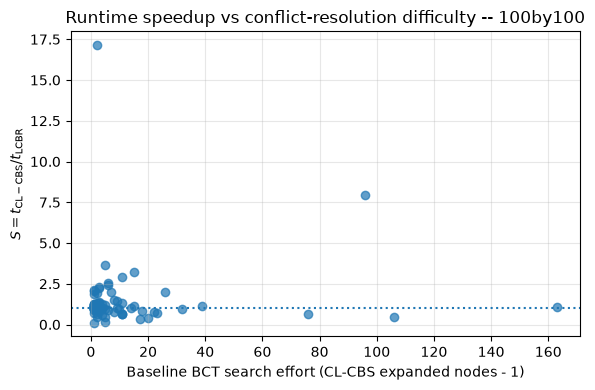

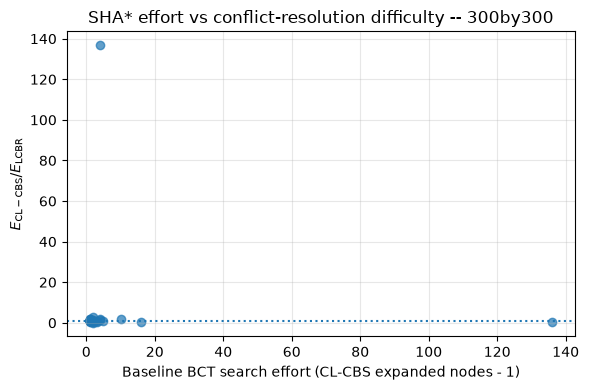

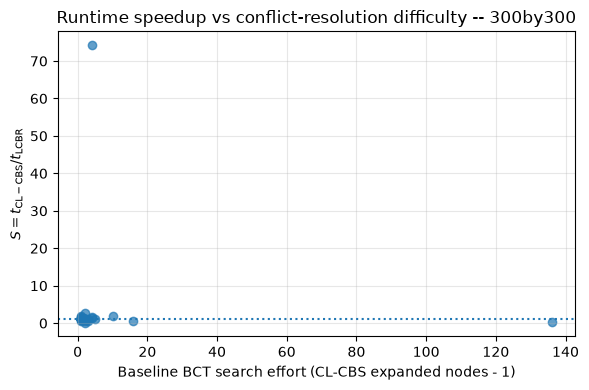

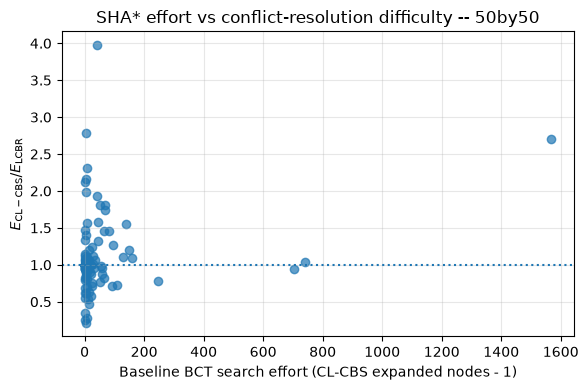

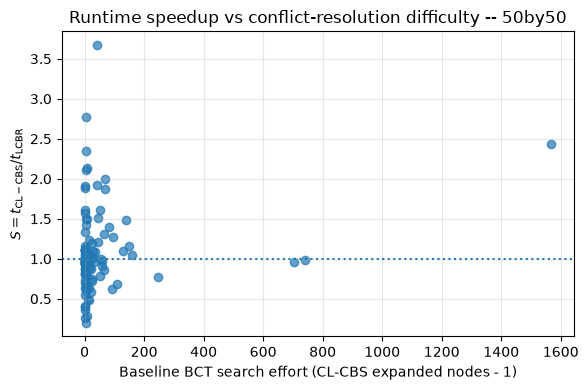

In [78]:
for map_size, d in difficulty.groupby("map_size"):

    # --------------------------------------------------------
    # Expansion ratio
    # --------------------------------------------------------

    fig, ax = plt.subplots(figsize=(6, 4))

    ax.scatter(
        d["baseline_BCT_effort"],
        d["E_ratio"],
        alpha=0.7
    )

    ax.axhline(
        1.0,
        linestyle=":"
    )

    ax.set_xlabel(
        "Baseline BCT search effort "
        "(CL-CBS expanded nodes - 1)"
    )

    ax.set_ylabel(
        r"$E_{\mathrm{CL-CBS}} / E_{\mathrm{LCBR}}$"
    )

    ax.set_title(
        f"SHA* effort vs conflict-resolution difficulty -- {map_size}"
    )

    ax.grid(alpha=0.3)

    fig.tight_layout()
    plt.show()

    # --------------------------------------------------------
    # Runtime speedup
    # --------------------------------------------------------

    fig, ax = plt.subplots(figsize=(6, 4))

    ax.scatter(
        d["baseline_BCT_effort"],
        d["speedup"],
        alpha=0.7
    )

    ax.axhline(
        1.0,
        linestyle=":"
    )

    ax.set_xlabel(
        "Baseline BCT search effort "
        "(CL-CBS expanded nodes - 1)"
    )

    ax.set_ylabel(
        r"$S=t_{\mathrm{CL-CBS}}/t_{\mathrm{LCBR}}$"
    )

    ax.set_title(
        f"Runtime speedup vs conflict-resolution difficulty -- {map_size}"
    )

    ax.grid(alpha=0.3)

    fig.tight_layout()
    plt.show()

In [79]:
print(
    difficulty["baseline_BCT_effort"]
    .value_counts()
    .sort_index()
    .head(30)
)

print("\nQuantiles:")
print(
    difficulty["baseline_BCT_effort"]
    .quantile([0, .25, .50, .75, .80, .90, .95, .99, 1])
)

baseline_BCT_effort
1     77
2     40
3     21
4     23
5     10
6      8
7      5
8      5
9      4
10     5
11     7
14     4
15     4
16     2
17     3
18     1
20     2
22     2
23     2
24     1
25     2
26     1
27     1
28     1
31     1
32     1
34     1
39     1
40     1
41     1
Name: count, dtype: int64

Quantiles:
0.00       1.00
0.25       1.00
0.50       3.00
0.75      11.00
0.80      15.00
0.90      44.60
0.95      95.20
0.99     411.24
1.00    1567.00
Name: baseline_BCT_effort, dtype: float64


### Difficulty-Stratified Analysis

The active instances exhibit a strongly skewed baseline BCT search effort:
the median is 3 expanded nodes beyond the root, the 75th percentile is 11,
and a small number of difficult instances require substantially larger
search trees. We therefore stratify instances using the empirical quartiles:

- **Low:** baseline BCT effort $\leq 3$,
- **Medium:** $4$--$11$,
- **High:** $>11$.

This stratification tests whether the relative computational benefit of
LCBR changes as conflict resolution becomes more demanding.

In [80]:
# ============================================================
# Difficulty-stratified analysis
# ============================================================

difficulty["difficulty_group"] = pd.cut(
    difficulty["baseline_BCT_effort"],
    bins=[0, 3, 11, np.inf],
    labels=["Low", "Medium", "High"],
    include_lowest=True
)

difficulty_summary = (
    difficulty
    .groupby(["map_size", "difficulty_group"], observed=True)
    .agg(
        n=("E_ratio", "count"),

        BCT_median=(
            "baseline_BCT_effort",
            "median"
        ),

        E_ratio_median=(
            "E_ratio",
            "median"
        ),
        E_ratio_p25=(
            "E_ratio",
            lambda x: x.quantile(0.25)
        ),
        E_ratio_p75=(
            "E_ratio",
            lambda x: x.quantile(0.75)
        ),

        speedup_median=(
            "speedup",
            "median"
        ),
        speedup_p25=(
            "speedup",
            lambda x: x.quantile(0.25)
        ),
        speedup_p75=(
            "speedup",
            lambda x: x.quantile(0.75)
        ),

        N_LL_ratio_median=(
            "N_LL_ratio",
            "median"
        )
    )
    .reset_index()
)

display(difficulty_summary)

,map_size,difficulty_group,n,BCT_median,E_ratio_median,E_ratio_p25,E_ratio_p75,speedup_median,speedup_p25,speedup_p75,N_LL_ratio_median
0,100by100,Low,54,1.0,1.037726,0.990604,1.194581,1.074084,0.980426,1.180838,1.000000
1,100by100,Medium,24,6.0,1.008192,0.776531,1.556378,1.011963,0.737489,1.474833,1.000000
2,100by100,High,15,23.0,0.982161,0.635297,1.220269,0.970314,0.673579,1.156252,1.312500
3,300by300,Low,30,1.0,1.034465,1.006445,1.169730,1.039134,1.023084,1.160794,1.000000
4,300by300,Medium,5,4.0,1.689205,1.469065,1.744917,1.731846,1.405762,1.849525,0.800000
5,300by300,High,2,76.0,0.384808,0.284607,0.485009,0.401074,0.293571,0.508577,2.893382
6,50by50,Low,54,1.0,1.000000,0.976648,1.000000,0.976753,0.883018,1.087002,1.000000
7,50by50,Medium,38,5.5,0.986817,0.961327,1.056587,0.992536,0.943486,1.054559,1.000000
8,50by50,High,43,45.0,1.008991,0.873061,1.299432,1.016138,0.880145,1.248117,1.000000


In [81]:
overall_difficulty = (
    difficulty
    .groupby("difficulty_group", observed=True)
    .agg(
        n=("E_ratio", "count"),

        BCT_median=("baseline_BCT_effort", "median"),

        E_ratio_median=("E_ratio", "median"),
        E_ratio_p25=("E_ratio", lambda x: x.quantile(.25)),
        E_ratio_p75=("E_ratio", lambda x: x.quantile(.75)),

        speedup_median=("speedup", "median"),
        speedup_p25=("speedup", lambda x: x.quantile(.25)),
        speedup_p75=("speedup", lambda x: x.quantile(.75)),

        N_LL_ratio_median=("N_LL_ratio", "median")
    )
    .reset_index()
)

display(overall_difficulty)

,difficulty_group,n,BCT_median,E_ratio_median,E_ratio_p25,E_ratio_p75,speedup_median,speedup_p25,speedup_p75,N_LL_ratio_median
0,Low,138,1.0,1.002398,0.993262,1.114044,1.028948,0.953327,1.144058,1.0
1,Medium,67,6.0,1.000000,0.944267,1.278445,1.008519,0.938164,1.348377,1.0
2,High,60,39.5,0.997988,0.775744,1.275175,1.001999,0.780412,1.213941,1.0


## Layer 4 -- Solution Quality and Trajectory Side Effects

This analysis evaluates whether local repair changes solution quality or
trajectory behavior relative to CL-CBS. Comparisons are paired by
`instance_id` and restricted to $\mathcal{I}_{\mathrm{both}}$, i.e.,
instances successfully solved by both methods.

For each instance, the relative change is

$$
\Delta X =
100\frac{X_{\mathrm{LCBR}}-X_{\mathrm{CL-CBS}}}
{X_{\mathrm{CL-CBS}}},
$$

where positive values indicate an increase under LCBR. We examine final
SoC, maximum path length, mission completion time, direction switches,
and reverse-travel distance.

In [82]:
# ============================================================
# Layer 4 -- Solution quality and trajectory side effects
# I_both only
# ============================================================

quality_rows = []

metrics = {
    "SoC_final": "SoC",
    "L_max_final": "L_max",
    "mission_completion_time": "mission_time",
    "N_switch": "N_switch",
    "D_reverse": "D_reverse",
}

for map_size in sorted(instances["map_size"].dropna().unique()):

    cc, ll = make_paired(
        instances[instances["map_size"] == map_size],
        delta_w=MAIN_DW
    )

    if cc.empty:
        continue

    for column, label in metrics.items():

        valid = (
            cc[column].notna() &
            ll[column].notna()
        )

        a = cc.loc[valid, column]
        b = ll.loc[valid, column]

        # Relative change only when CL-CBS denominator != 0
        nonzero = a != 0

        delta_pct = (
            100.0 *
            (b.loc[nonzero] - a.loc[nonzero]) /
            a.loc[nonzero]
        )

        absolute_delta = b - a

        try:
            p = (
                wilcoxon(a, b).pvalue
                if len(a) and not (a == b).all()
                else 1.0
            )
        except ValueError:
            p = np.nan

        quality_rows.append({
            "map_size": map_size,
            "metric": label,
            "n": len(a),

            "CL_CBS_median": a.median(),
            "LCBR_median": b.median(),

            "absolute_delta_median":
                absolute_delta.median(),

            "relative_delta_pct_median":
                delta_pct.median()
                if len(delta_pct)
                else np.nan,

            "relative_delta_pct_p25":
                delta_pct.quantile(0.25)
                if len(delta_pct)
                else np.nan,

            "relative_delta_pct_p75":
                delta_pct.quantile(0.75)
                if len(delta_pct)
                else np.nan,

            "wilcoxon_p": p,
        })


quality_summary = pd.DataFrame(quality_rows)

display(quality_summary)

,map_size,metric,n,CL_CBS_median,LCBR_median,absolute_delta_median,relative_delta_pct_median,relative_delta_pct_p25,relative_delta_pct_p75,wilcoxon_p
0,100by100,SoC,193,324.67800,327.99100,0.0,0.0,0.0,0.0,0.000915
1,100by100,L_max,193,48.78280,49.04650,0.0,0.0,0.0,0.0,0.024043
2,100by100,mission_time,193,26.00000,26.00000,0.0,0.0,0.0,0.0,0.000003
3,100by100,N_switch,193,10.00000,10.00000,0.0,0.0,0.0,0.0,0.002239
4,100by100,D_reverse,193,44.82350,45.01900,0.0,0.0,0.0,0.0,0.045693
5,300by300,SoC,118,1204.45500,1204.45500,0.0,0.0,0.0,0.0,0.001090
6,300by300,L_max,118,137.71500,138.55650,0.0,0.0,0.0,0.0,0.130665
7,300by300,mission_time,118,67.00000,68.00000,0.0,0.0,0.0,0.0,0.008668
8,300by300,N_switch,118,14.00000,14.00000,0.0,0.0,0.0,0.0,0.004258
9,300by300,D_reverse,118,48.45230,48.45230,0.0,0.0,0.0,0.0,0.381172


In [83]:
change_rows = []

for map_size in sorted(instances["map_size"].dropna().unique()):

    cc, ll = make_paired(
        instances[instances["map_size"] == map_size],
        delta_w=MAIN_DW
    )

    if cc.empty:
        continue

    for column, label in metrics.items():

        valid = cc[column].notna() & ll[column].notna()

        a = cc.loc[valid, column]
        b = ll.loc[valid, column]

        change_rows.append({
            "map_size": map_size,
            "metric": label,
            "n": len(a),

            "LCBR_lower_pct":
                100 * (b < a).mean(),

            "equal_pct":
                100 * (b == a).mean(),

            "LCBR_higher_pct":
                100 * (b > a).mean(),
        })


change_summary = pd.DataFrame(change_rows)

display(change_summary)

,map_size,metric,n,LCBR_lower_pct,equal_pct,LCBR_higher_pct
0,100by100,SoC,193,10.880829,64.248705,24.870466
1,100by100,L_max,193,10.880829,75.129534,13.989637
2,100by100,mission_time,193,2.072539,81.347150,16.580311
3,100by100,N_switch,193,2.590674,87.564767,9.844560
4,100by100,D_reverse,193,10.880829,70.466321,18.652850
5,300by300,SoC,118,10.169492,68.644068,21.186441
6,300by300,L_max,118,2.542373,90.677966,6.779661
7,300by300,mission_time,118,0.847458,91.525424,7.627119
8,300by300,N_switch,118,1.694915,88.135593,10.169492
9,300by300,D_reverse,118,11.864407,75.423729,12.711864


In [84]:
rows = []

for map_size in sorted(instances["map_size"].dropna().unique()):

    cc, ll = make_paired(
        instances[instances["map_size"] == map_size],
        delta_w=MAIN_DW
    )

    delta = (
        100.0 *
        (ll["SoC_final"] - cc["SoC_final"]) /
        cc["SoC_final"]
    )

    changed = delta[delta != 0]

    rows.append({
        "map_size": map_size,
        "n_total": len(delta),
        "n_changed": len(changed),

        "changed_pct":
            100 * len(changed) / len(delta),

        "delta_changed_median_pct":
            changed.median(),

        "abs_delta_changed_median_pct":
            changed.abs().median(),

        "abs_delta_changed_p75_pct":
            changed.abs().quantile(.75),

        "abs_delta_changed_max_pct":
            changed.abs().max(),
    })

soc_change_magnitude = pd.DataFrame(rows)

display(soc_change_magnitude)

,map_size,n_total,n_changed,changed_pct,delta_changed_median_pct,abs_delta_changed_median_pct,abs_delta_changed_p75_pct,abs_delta_changed_max_pct
0,100by100,193,69,35.751295,0.161090,0.219651,0.575589,1.739780
1,300by300,118,37,31.355932,0.105671,0.118939,0.208336,0.671666
2,50by50,216,53,24.537037,-0.000487,0.467241,1.537379,7.783168


## Full pipeline: end-to-end examples (Stage 1 -> 2 -> 3)

Illustrative, not statistical -- see `docs/LCBR.md` Sec. 5.6. For each
instance: Stage 1's cost matrix (heatmap), Stage 2's resolved assignment
(table), Stage 3's per-instance conflict data (from `low_level_queries.csv`,
already at full per-query granularity, no separate export needed), and
the rendered comparison image/GIF.


In [86]:
_fp_runs = _load.discover_runs("full_pipeline", REPO_ROOT)
PIPELINE_RUN_DIR = _fp_runs[-1] if _fp_runs else None
print("PIPELINE_RUN_DIR:", PIPELINE_RUN_DIR)

if PIPELINE_RUN_DIR:
    pipeline_instances = pd.read_csv(os.path.join(PIPELINE_RUN_DIR, "instance_metrics.csv"))
    pipeline_queries = pd.read_csv(os.path.join(PIPELINE_RUN_DIR, "low_level_queries.csv"))
    PIPELINE_INSTANCE_NAMES = sorted(pipeline_instances.instance_id.unique())
    display(pipeline_instances[["instance_id", "method", "success", "conflict_resolution_runtime_s",
                                "bct_nodes_expanded", "SoC_final", "L_max_final"]])


PIPELINE_RUN_DIR: /home/batbaina/Downloads/UGV-COORDINATION/LCBR/runs/full_pipeline/20260812T232533


,instance_id,method,success,conflict_resolution_runtime_s,bct_nodes_expanded,SoC_final,L_max_final
0,instance1_grouped_scattered,CL-CBS,1,0.167213,5,210.949,51.5719
1,instance1_grouped_scattered,LCBR,1,0.044027,4,210.823,51.5719
2,instance2_grouped_wall,CL-CBS,1,0.000034,1,253.983,63.2114
3,instance2_grouped_wall,LCBR,1,0.000026,1,253.983,63.2114
4,instance3_grouped_croprows,CL-CBS,1,0.078865,2,196.408,70.0020
5,instance3_grouped_croprows,LCBR,1,0.275363,6,210.009,72.8485


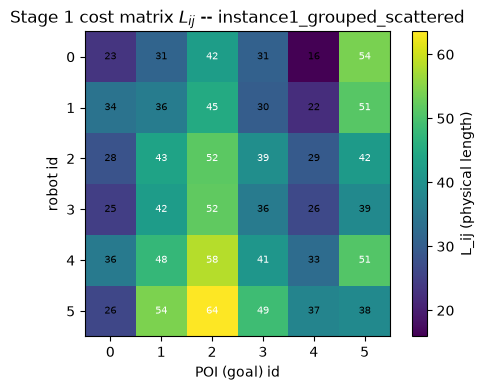

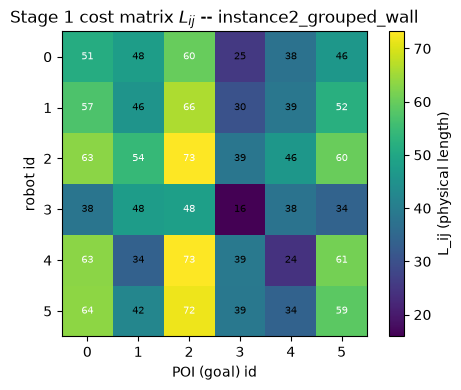

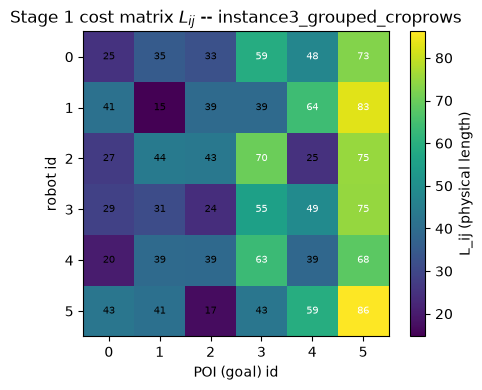

In [42]:
if PIPELINE_RUN_DIR:
    stage12_dir = os.path.join(PIPELINE_RUN_DIR, "stage1_stage2")
    for name in PIPELINE_INSTANCE_NAMES:
        cm_path = os.path.join(stage12_dir, f"{name}_cost_matrix.csv")
        if not os.path.exists(cm_path):
            continue
        cm = pd.read_csv(cm_path)
        cm.loc[cm.L_ij < 0, "L_ij"] = np.nan
        pivot = cm.pivot(index="robot_id", columns="poi_id", values="L_ij")

        fig, ax = plt.subplots(figsize=(5, 4))
        im = ax.imshow(pivot.values, cmap="viridis")
        ax.set_xticks(range(len(pivot.columns))); ax.set_yticks(range(len(pivot.index)))
        ax.set_xlabel("POI (goal) id"); ax.set_ylabel("robot id")
        ax.set_title(f"Stage 1 cost matrix $L_{{ij}}$ -- {name}")
        for r in pivot.index:
            for cix in pivot.columns:
                v = pivot.loc[r, cix]
                if not np.isnan(v):
                    ax.text(cix, r, f"{v:.0f}", ha="center", va="center", fontsize=7,
                           color="white" if v > np.nanmean(pivot.values) else "black")
        fig.colorbar(im, ax=ax, label="L_ij (physical length)")
        fig.tight_layout()
        plt.show()


In [43]:
if PIPELINE_RUN_DIR:
    for name in PIPELINE_INSTANCE_NAMES:
        as_path = os.path.join(stage12_dir, f"{name}_assignment.csv")
        if not os.path.exists(as_path):
            continue
        assign = pd.read_csv(as_path)
        print(f"=== Stage 2 assignment: {name} ===")
        print(assign.to_string(index=False))
        print(f"SoC_nominal = {assign.loc[assign.feasible==1, 'L_ij'].sum():.2f}\n")


In [44]:
if PIPELINE_RUN_DIR:
    for name in PIPELINE_INSTANCE_NAMES:
        q = pipeline_queries[pipeline_queries.instance_id == name]
        if q.empty:
            continue
        print(f"=== Stage 3 conflict summary: {name}  ({len(q)} low-level calls) ===")
        # dropna=False: CL-CBS's full-horizon rows carry the literal string
        # "n/a" for local_outcome, which pandas' CSV reader parses as NaN --
        # groupby() drops NaN keys by default, which would silently make
        # CL-CBS vanish from this summary without dropna=False.
        print(q.groupby(["method", "query_type", "local_outcome"], dropna=False).size())
        print()


=== Stage 3 conflict summary: instance1_grouped_scattered  (14 low-level calls) ===
method  query_type  local_outcome
CL-CBS  full        NaN              8
LCBR    local       success          6
dtype: int64

=== Stage 3 conflict summary: instance3_grouped_croprows  (14 low-level calls) ===
method  query_type  local_outcome
CL-CBS  full        NaN              2
LCBR    full        NaN              2
        local       inapplicable     2
                    success          8
dtype: int64



instance1_grouped_scattered: CL-CBS vs LCBR


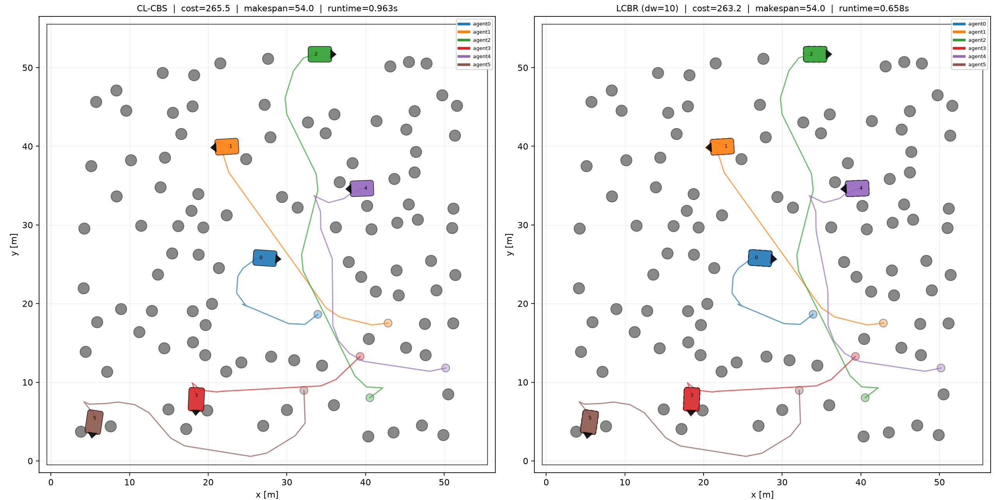

instance2_grouped_wall: CL-CBS vs LCBR


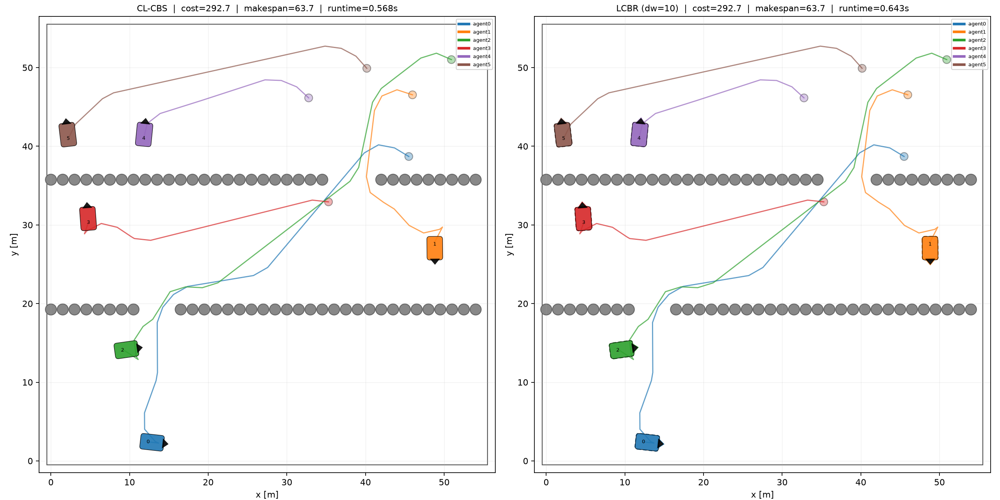

instance3_grouped_croprows: CL-CBS vs LCBR


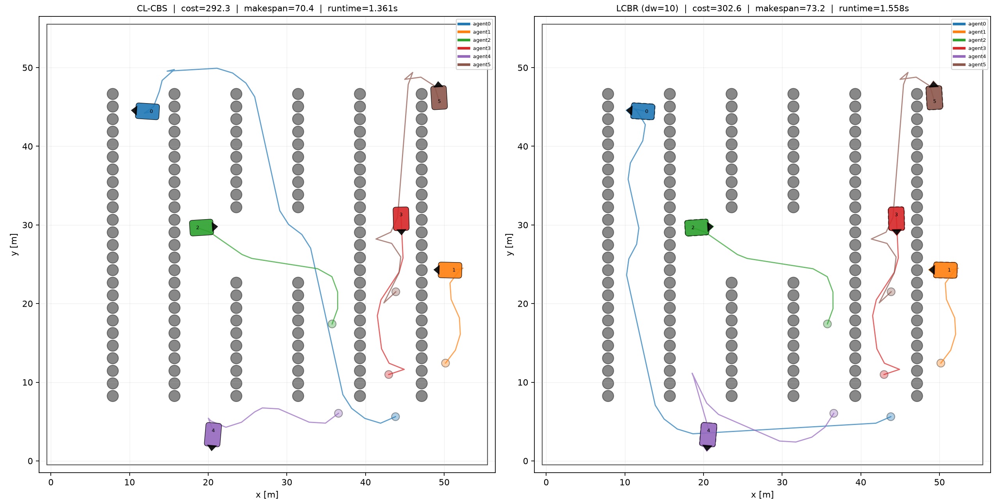

In [45]:
from IPython.display import Image, display

if PIPELINE_RUN_DIR:
    fig_dir = os.path.join(PIPELINE_RUN_DIR, "figures")
    for name in PIPELINE_INSTANCE_NAMES:
        path = os.path.join(fig_dir, f"{name}_compare.png")
        if os.path.exists(path):
            print(f"{name}: CL-CBS vs LCBR")
            display(Image(filename=path))


instance1_grouped_scattered_lcbr_dw10.gif


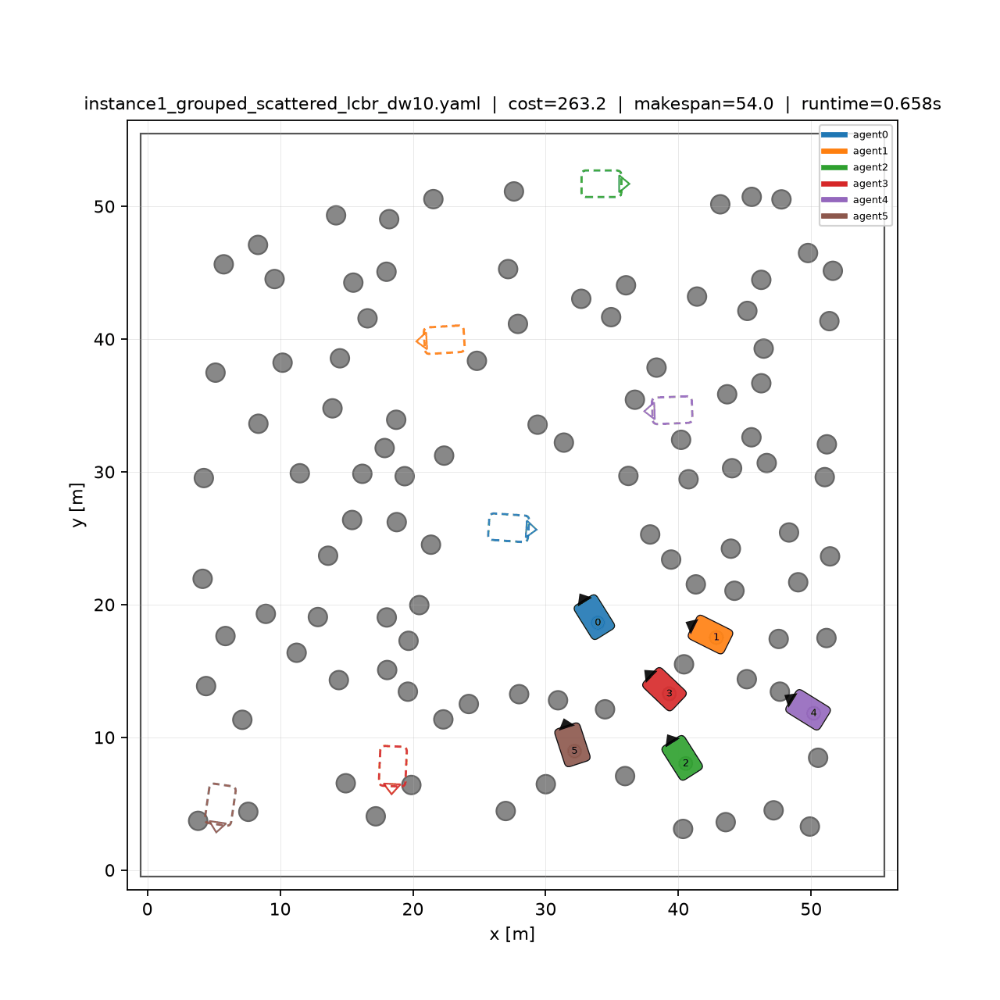

instance2_grouped_wall_lcbr_dw10.gif


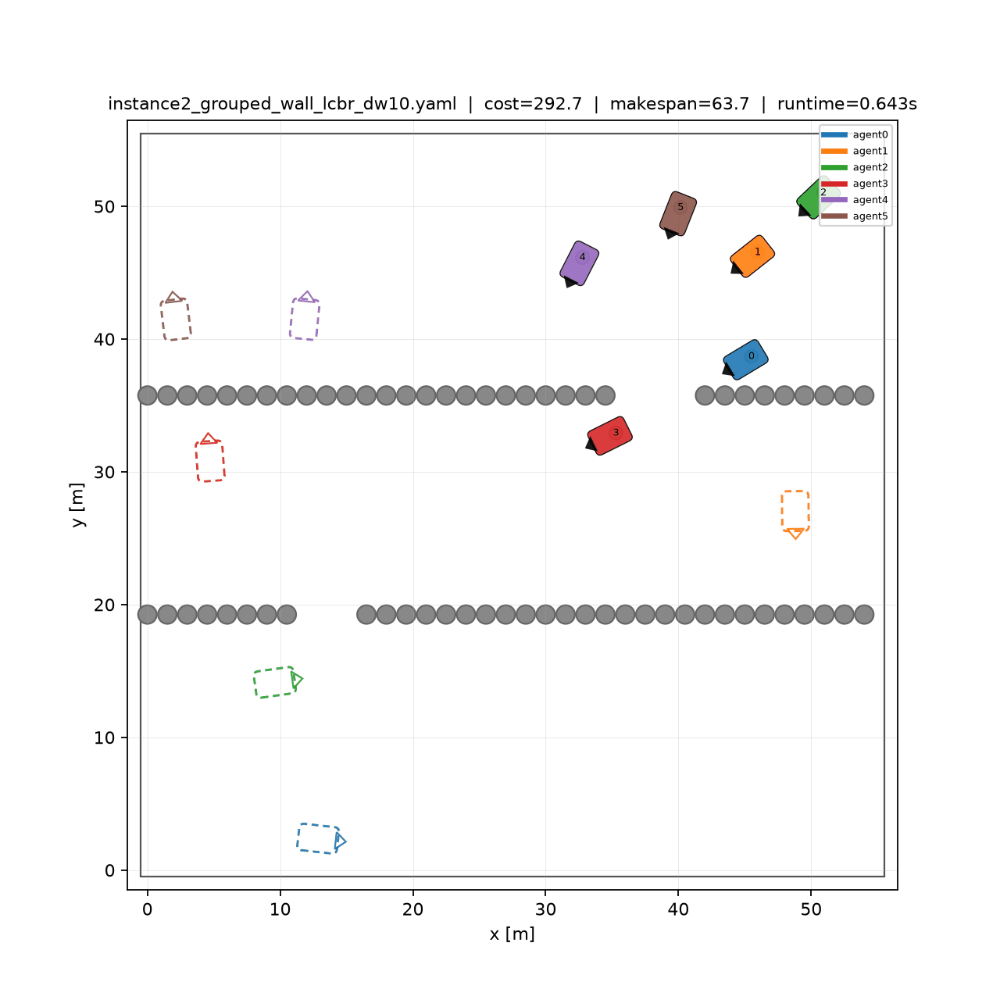

instance3_grouped_croprows_lcbr_dw10.gif


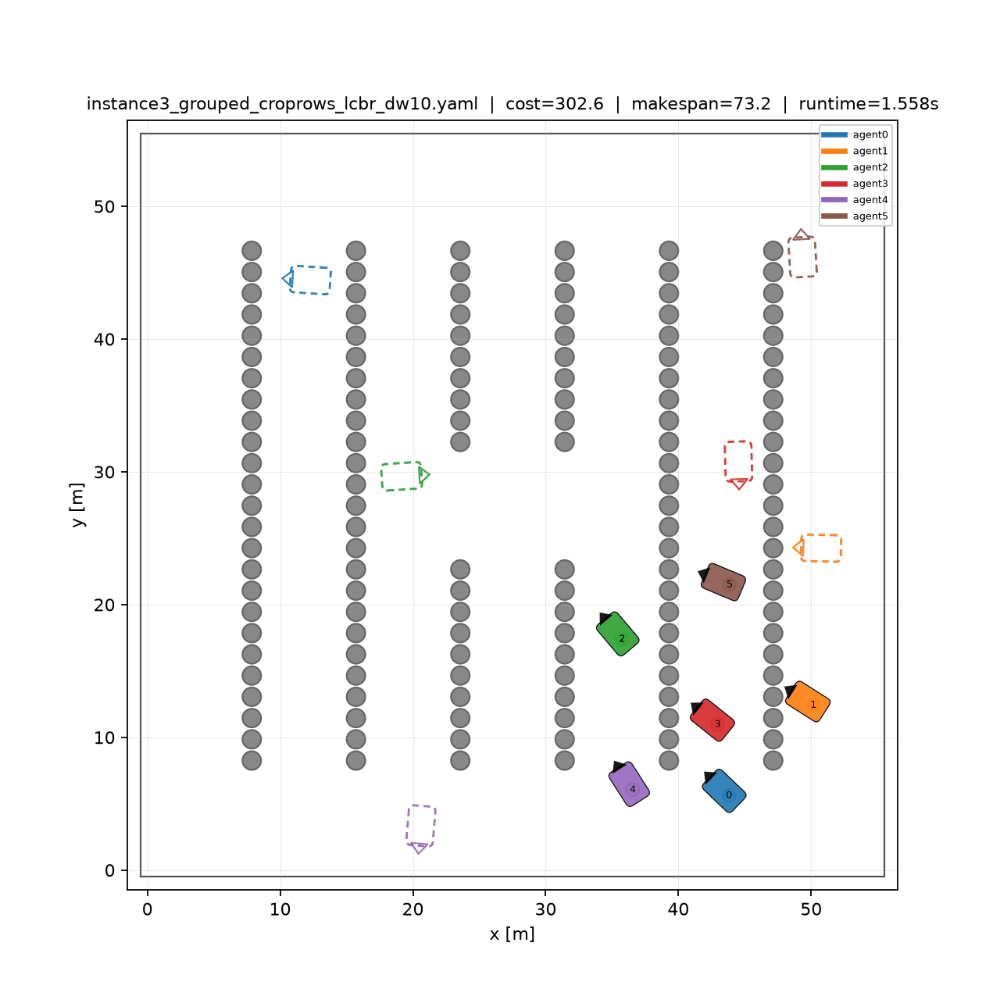

In [46]:
if PIPELINE_RUN_DIR:
    for f in sorted(os.listdir(fig_dir)):
        if f.endswith(".gif"):
            print(f)
            display(Image(filename=os.path.join(fig_dir, f)))


## Scratch space

`instances`/`queries` are the two raw DataFrames (`map_size`/`scenario`/
`N_LL`/`E_bar` already added). `make_paired(df, delta_w=...)` builds an
aligned (CL-CBS, LCBR) pair from any subset of `instances` you hand it.


In [47]:
# e.g.:
# cc, ll = make_paired(instances[instances.map_size == "50by50"])
# ll.plot.scatter(x="num_agents", y="SoC_final")
